# From Regression to Classification


In [1]:
def get_importances(model, feature_names=None,name='Feature Importance',
                   sort=False, ascending=True):
    
    ## checking for feature names
    if feature_names == None:
        feature_names = model.feature_names_in_
        
    ## Saving the feature importances
    importances = pd.Series(model.feature_importances_, index= feature_names,
                           name=name)
    
    # sort importances
    if sort == True:
        importances = importances.sort_values(ascending=ascending)
        
    return importances

In [2]:
def plot_importance(importances, top_n=None,  figsize=(8,6)):
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Importance',
            ylabel='Feature Names',
            title=title)
    ## return ax in case want to continue to update/modify figure
    return ax

In [3]:
def get_color_dict(importances, color_rest='#006ba4' , color_top='green',
                    top_n=7):
    ## color -coding top 5 bars
    highlight_feats = importances.sort_values(ascending=True).tail(top_n).index
    colors_dict = {col: color_top if col in highlight_feats else color_rest for col in importances.index}
    return colors_dict

In [4]:
def annotate_hbars(ax, ha='left',va='center',size=12,  xytext=(4,0),
                  textcoords='offset points'):
    for bar in ax.patches:
    
        ## calculate center of bar
        bar_ax = bar.get_y() + bar.get_height()/2
        ## get the value to annotate
        val = bar.get_width()
        if val < 0:
            val_pos = 0
        else:
            val_pos = val
        # ha and va stand for the horizontal and vertical alignment
        ax.annotate(f"{val:.3f}", (val_pos,bar_ax), ha=ha,va=va,size=size,
                        xytext=xytext, textcoords=textcoords)

In [40]:
def get_coeffs_linreg(lin_reg, feature_names = None, sort=True,ascending=True,
                     name='LinearRegression Coefficients'):
    if feature_names is None:
        feature_names = lin_reg.feature_names_in_
    ## Saving the coefficients
    coeffs = pd.Series(lin_reg.coef_, index= feature_names)
    coeffs['intercept'] = lin_reg.intercept_
    if sort==True:
        coeffs = coeffs.sort_values(ascending=ascending)
    return coeffs

In [5]:
def plot_coeffs(coeffs, top_n=None,  figsize=(4,5), 
                intercept=False,  intercept_name = "intercept", 
                annotate=False, ha='left',va='center', size=12, 
                xytext=(4,0), textcoords='offset points'):
    """ Plots the top_n coefficients from a Series, with optional annotations.
    """
    # Drop intercept if intercept=False and 
    if (intercept==False) & ( intercept_name in coeffs.index):
        coeffs = coeffs.drop(intercept_name)
    if top_n==None:
        ## sort all features and set title
        plot_vals = coeffs#.sort_values()
        title = "All Coefficients - Ranked by Magnitude"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)
        
        ## sort features and keep top_n and set title
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        title = f"Top {top_n} Largest Coefficients"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Coefficient', 
            ylabel='Feature Names', 
            title=title)
    ax.axvline(0, color='k')
    if annotate==True:
        annotate_hbars(ax, ha=ha,va=va,size=size,xytext=xytext, textcoords=textcoords)
    return ax

In [28]:
def plot_importance_color(importances, top_n=None,  figsize=(8,6), 
                          color_dict=None):
    
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## create plot with colors, if provided
    if color_dict is not None:
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        ax = plot_vals.plot(kind='barh', figsize=figsize, color=colors)
        
    else:
        ## create plot without colors, if not provided
        ax = plot_vals.plot(kind='barh', figsize=figsize)
        
    # set titles and axis labels
    ax.set(xlabel='Importance', 
           ylabel='Feature Names', 
           title=title)
    
    ## return ax in case want to continue to update/modify figure
    return ax

In [6]:
## Our standard imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
## Preprocessing tools
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
## Models & evaluation metrics
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import joblib
## setting random state for reproducibility
SEED = 321
np.random.seed(SEED)
## set text displays for sklearn
from sklearn import set_config
set_config(display='text')
## Using pd.set_option to display more columns
pd.set_option('display.max_columns',50)

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
fav_style = ('ggplot','tableau-colorblind10')
fav_context  ={'context':'notebook', 'font_scale':1.2}
plt.style.use(fav_style)
sns.set_context(**fav_context)
plt.rcParams['savefig.transparent'] = False
plt.rcParams['savefig.bbox'] = 'tight'

In [8]:
## Load in the student performance - Portuguese dataset & display the head and info
url = "https://docs.google.com/spreadsheets/d/e/2PACX-1vS6xDKNpWkBBdhZSqepy48bXo55QnRv1Xy6tXTKYzZLMPjZozMfYhHQjAcC8uj9hQ/pub?output=xlsx"
df = pd.read_excel(url,sheet_name='student-por')
df.info()
df.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      649 non-null    object
 1   sex         649 non-null    object
 2   age         649 non-null    int64 
 3   address     649 non-null    object
 4   famsize     649 non-null    object
 5   Pstatus     649 non-null    object
 6   Medu        649 non-null    int64 
 7   Fedu        649 non-null    int64 
 8   Mjob        649 non-null    object
 9   Fjob        649 non-null    object
 10  reason      649 non-null    object
 11  guardian    649 non-null    object
 12  traveltime  649 non-null    int64 
 13  studytime   649 non-null    int64 
 14  failures    649 non-null    int64 
 15  schoolsup   649 non-null    object
 16  famsup      649 non-null    object
 17  paid        649 non-null    object
 18  activities  649 non-null    object
 19  nursery     649 non-null    object
 20  higher    

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12


## Rethinking Our Target
We need to determine what qualifies as an "at-risk" student for our stakeholder?
Note: talking to your stakeholder is ALWAYS a good idea when making this choice.
There are several different ways we could define an at-risk student.
Students in the 30 percentile or lower (the bottom third of students).
Students who fail (receive an F).
Students who receive a D or an F in their final period.
After talking with our stakeholder, we've agreed that predicting which students will receive an F would be the most effective target.
First, we must convert the student scores into a letter grade.
## Calculating Letter Grades from G3
We want to determine which students will receive an F for their G3 score. Right now, we have the grades as values out of 20.
The school informed us that when they determine letter grades, they:
First, convert the raw scores out of 20 into % out of 100.
Bin the % grades to determine the letter:
'A': if G3>=90
'B': if G3>= 80 & G3 <90
'C': if G3>= 70 & G3 <80
'D': if G3>= 60 & G3 < 70
'F': if G3 is <60
Our first task is to convert the G3 scores into %'s.

In [9]:
## convert G3 to a % out of 100
df['G3(%)'] = (df['G3']/20) *100
df['G3(%)'].head()

0    55.0
1    55.0
2    60.0
3    70.0
4    65.0
Name: G3(%), dtype: float64

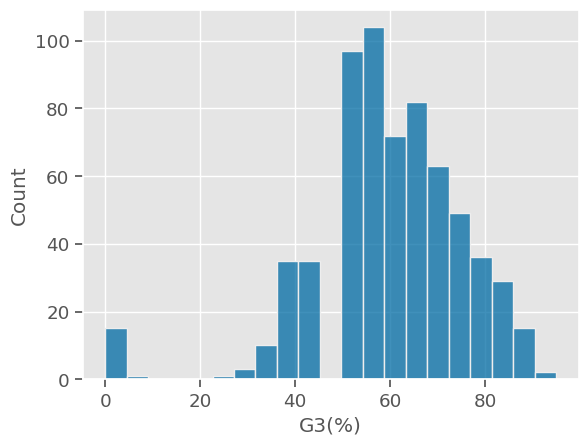

In [10]:
## visual distribution of % grades
ax = sns.histplot(data=df, x='G3(%)')

Next we need to bin the percentages into letter grades. While there are many ways to do this, one of the most effective is to use panda's cut function.
## Using pd.cut
Documentation for pd.cut
pd.cut is a very flexible function. If we simply knew how many bins we need but don't care about the actual cutoffs for each bin, we can simply provide it an integer for the number of bins.
For our needs, we will provide a list of the exact bin edges that will be used to cut the data.
Note that when we are providing a list of bin edges, we need to provide 1 more value than the # of bins we want to have. - For example, we want to bin the % grades into 5 bins: F,D,C,B,A - In order to create a list of bin edges, the very first value we include is the lowest possible value that is included in the lowest bin. Since we need to account for scores as low as 0, we need to have our first bin edge start at 0. - Next, we define the right edge of the our lowest bin. Since we are binning 0 - 60 as F, the right edge will be 60. - thus far we have used [0,60] to define the left and right edges of our First bin. - For the remainder of the bins, the right edge of the previous bin is also the left edge of the next bin. - Therefore, we only need to add 70 to our bin edges to define our second bin.

In [11]:
## defining bin edges
bins = [0,60,70,80,90,100]
grades = pd.cut(df['G3(%)'], bins=bins)
grades.value_counts().sort_index()

(0, 60]      358
(60, 70]     145
(70, 80]      85
(80, 90]      44
(90, 100]      2
Name: G3(%), dtype: int64

In [12]:
grades = pd.cut(df['G3(%)'], bins=bins,right=False)
grades.value_counts(dropna=False)

[0, 60)      301
[60, 70)     154
[70, 80)     112
[80, 90)      65
[90, 100)     17
Name: G3(%), dtype: int64

In [13]:
bins = [0,60,70,80,90,101]
grades = pd.cut(df['G3(%)'], bins=bins,right=False)
grades.value_counts()

[0, 60)      301
[60, 70)     154
[70, 80)     112
[80, 90)      65
[90, 101)     17
Name: G3(%), dtype: int64

In [14]:
## defining bins and their labels
bins = [0,60,70,80,90,101]
bin_labels = ['F','D','C','B','A']
grades = pd.cut(df['G3(%)'],bins, labels=bin_labels,include_lowest=True)
grades.value_counts()

F    373
D    145
C     85
B     44
A      2
Name: G3(%), dtype: int64

Now we can add these values to our DataFrame as a new column 'FinalGrade'.



In [15]:
df['FinalGrade'] = pd.cut(df['G3(%)'],bins, labels=bin_labels,include_lowest=True)
df

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,G3(%),FinalGrade
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11,55.0,F
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11,55.0,F
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12,60.0,F
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,no,yes,yes,yes,yes,yes,3,2,2,1,1,5,0,14,14,14,70.0,D
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,no,no,yes,yes,no,no,4,3,2,1,2,5,0,11,13,13,65.0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,MS,F,19,R,GT3,T,2,3,services,other,course,mother,1,3,1,no,no,no,yes,no,yes,yes,no,5,4,2,1,2,5,4,10,11,10,50.0,F
645,MS,F,18,U,LE3,T,3,1,teacher,services,course,mother,1,2,0,no,yes,no,no,yes,yes,yes,no,4,3,4,1,1,1,4,15,15,16,80.0,C
646,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1,1,1,1,1,5,6,11,12,9,45.0,F
647,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,6,10,10,10,50.0,F


In [16]:
## We can group by the letter grades and get the min/max of the scores to confirm 
df.groupby('FinalGrade')['G3(%)'].agg(['min','max','count'])

,min,max,count
FinalGrade,,,
F,0.0,60.0,373
D,65.0,70.0,145
C,75.0,80.0,85
B,85.0,90.0,44
A,95.0,95.0,2


Next, we will make a visualization showing how our students' grades are distributed with color-coded regions for each letter grade.



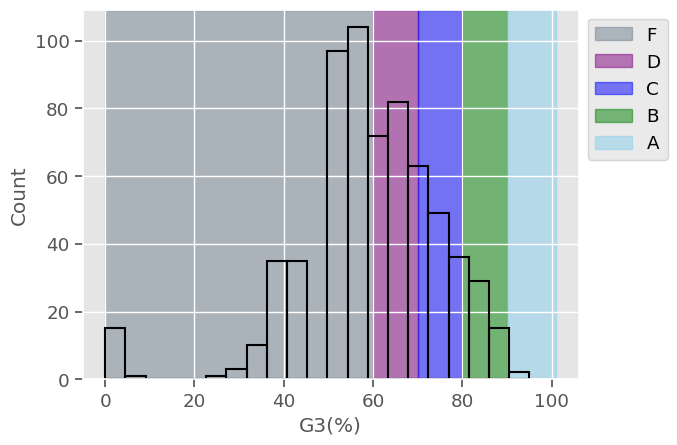

In [17]:
## visualizing the cutoffs for grades
ax = sns.histplot(data=df, x='G3(%)',color='k',fill=False)
colors = ['slategray','purple','blue','green','skyblue']
for i in range(len(bins)-1):
    x1 = bins[i]
    x2 = bins[i+1]
    label = bin_labels[i]
    ax.axvspan(x1,x2, label=label,color=colors[i],zorder=0,alpha=.5)
ax.legend(bbox_to_anchor=[1,1])

We can also view these distributions on two separate graphs.



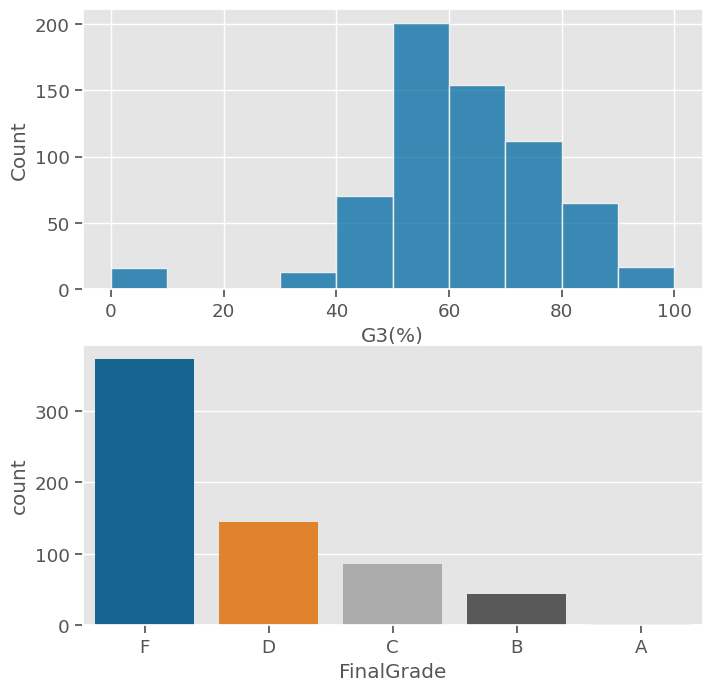

In [18]:
fig, axes = plt.subplots(nrows=2,figsize=(8,8))
sns.histplot(data=df, x='G3(%)',ax=axes[0], binwidth=10);
sns.countplot(data=df,x='FinalGrade',ax=axes[1],order=['F','D','C','B','A']);

## Making Our Final Target & X/y Data
Since we are interested in creating a binary classification. We will define a new column that simply indicates whether a student received an F (failed) or not (passed). We will also check the class balance by using value_counts(normalize=True).

In [19]:
## Define target as had a F or Above
df['target_F'] = df['FinalGrade'] == 'F'
df['target_F'].value_counts(normalize=True)

True     0.57473
False    0.42527
Name: target_F, dtype: float64

### Train Test Split

We must make sure to remove the original target that we used to calculate our grades. Otherwise, G3 and G3% would be perfect predictors of passing or failing!

In [20]:
## Make x and y variables
drop_feats = ['G1','G2','G3','G3(%)','FinalGrade']
y = df['target_F'].copy()
X = df.drop(columns=['target_F',*drop_feats]).copy()
## train-test-split with random state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=SEED)

### Preprocessing and Column Transformers

Since we will be revisiting RandomForest first, let's use drop='if_binary' in our OneHotEncoder to keep as many categories as possible without losing information.

In [21]:
## make categorical & numeric selectors
cat_sel = make_column_selector(dtype_include='object')
num_sel = make_column_selector(dtype_include='number')
## make pipelines for categorical vs numeric data
cat_pipe = make_pipeline(SimpleImputer(strategy='constant',
                                     fill_value='MISSING'),
                         OneHotEncoder(drop='if_binary', sparse=False))
num_pipe = make_pipeline(SimpleImputer(strategy='mean'))
## make the preprocessing column transformer
preprocessor = make_column_transformer((num_pipe, num_sel),
                                       (cat_pipe,cat_sel),                                      verbose_feature_names_out=False)
## fit column transformer and run get_feature_names_out
preprocessor.fit(X_train)
feature_names = preprocessor.get_feature_names_out()
X_train_df = pd.DataFrame(preprocessor.transform(X_train),
                           columns = feature_names, index = X_train.index)
X_test_df = pd.DataFrame(preprocessor.transform(X_test),
                           columns = feature_names, index = X_test.index)
X_test_df.head(3)

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
104,15.0,3.0,4.0,1.0,2.0,0.0,5.0,4.0,4.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0
284,18.0,2.0,1.0,1.0,1.0,2.0,3.0,2.0,5.0,2.0,5.0,5.0,4.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
579,18.0,1.0,3.0,1.0,1.0,0.0,4.0,3.0,3.0,2.0,3.0,3.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0


## RandomForestClassifier
Function for Evaluating Classification Models

In [22]:
def evaluate_classification(model, X_train,y_train,X_test,y_test,
                            normalize='true',cmap='Blues', figsize=(10,5)):
    header="\tCLASSIFICATION REPORT"
    dashes='--'*40
    print(f"{dashes}\n{header}\n{dashes}")
    ## training data
    print('[i] Training Data:')
    y_pred_train = model.predict(X_train)
    report_train = metrics.classification_report(y_train, y_pred_train)
    print(report_train)
    fig,ax = plt.subplots(figsize=figsize,ncols=2)
    metrics.ConfusionMatrixDisplay.from_estimator(model,X_train,y_train,
                                                  normalize=normalize,
                                                   cmap=cmap,ax=ax[0])
    metrics.RocCurveDisplay.from_estimator(model,X_train,y_train,ax=ax[1])
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].grid()
    
    fig.tight_layout()
    plt.show()
     
    print(dashes)
    ## test data
    print(f"[i] Test Data:")
    y_pred_test = model.predict(X_test)
    report_test = metrics.classification_report(y_test, y_pred_test)
    print(report_test)
    fig,ax = plt.subplots(figsize=figsize,ncols=2)
    metrics.ConfusionMatrixDisplay.from_estimator(model,X_test,y_test,
                                                  normalize=normalize,
                                                   cmap=cmap, ax=ax[0])
    metrics.RocCurveDisplay.from_estimator(model,X_test,y_test,ax=ax[1])
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].grid()
    fig.tight_layout()
    plt.show()

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       205
        True       1.00      1.00      1.00       281

    accuracy                           1.00       486
   macro avg       1.00      1.00      1.00       486
weighted avg       1.00      1.00      1.00       486



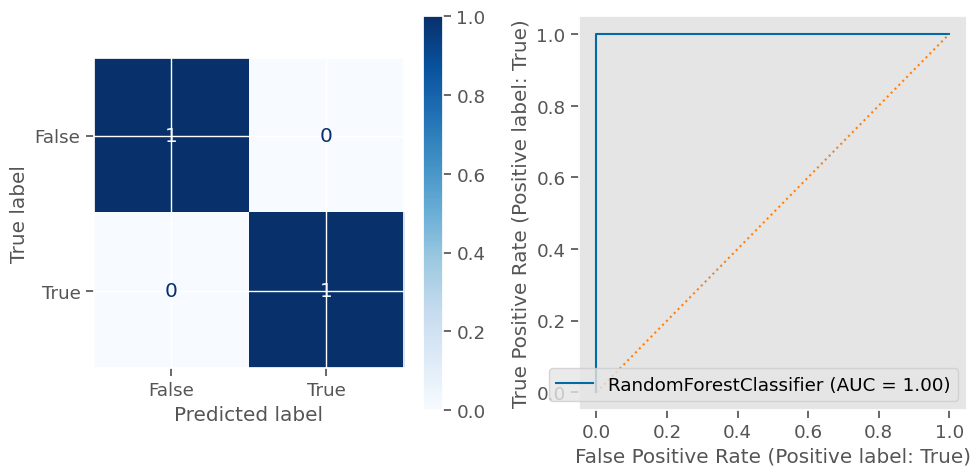

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

       False       0.81      0.70      0.75        71
        True       0.79      0.87      0.83        92

    accuracy                           0.80       163
   macro avg       0.80      0.79      0.79       163
weighted avg       0.80      0.80      0.80       163



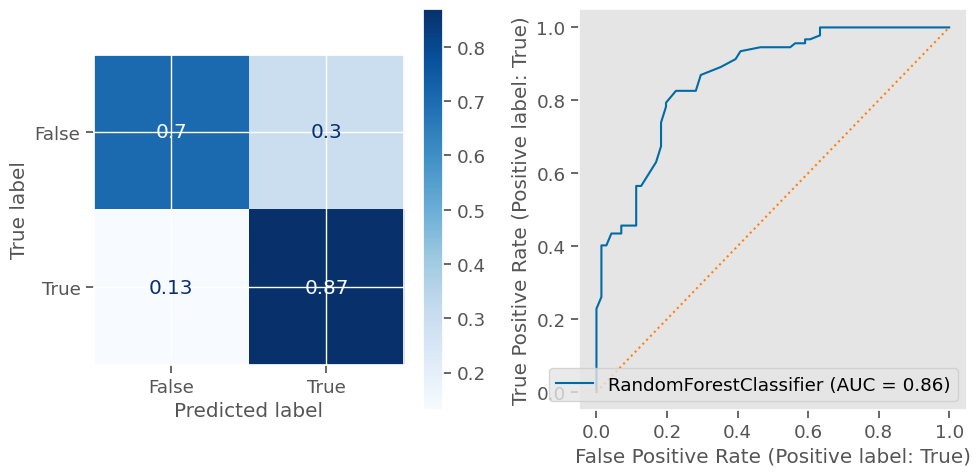

In [23]:
## fit random forest
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()#class_weight='balanced')
rf_clf.fit(X_train_df,y_train)
evaluate_classification(rf_clf,X_train_df,y_train, X_test_df,y_test)

We have an overall accuracy of .80, which isn't bad. However, our task is to identify the students who will get an F (the True group). So let's take a closer look at our True class scores.
The Recall score for True is .87. This means that out of all of the students who will fail, our model is identifying 87% of them correctly. While this isn't perfect (there are still 13% of students who will fail that are falling through the cracks), this is MUCH better than our R-squared of 0.35!
As we can see above, our classification task is performing much better than our regression version of the task! This is a much more appropriate model to extract insights from.

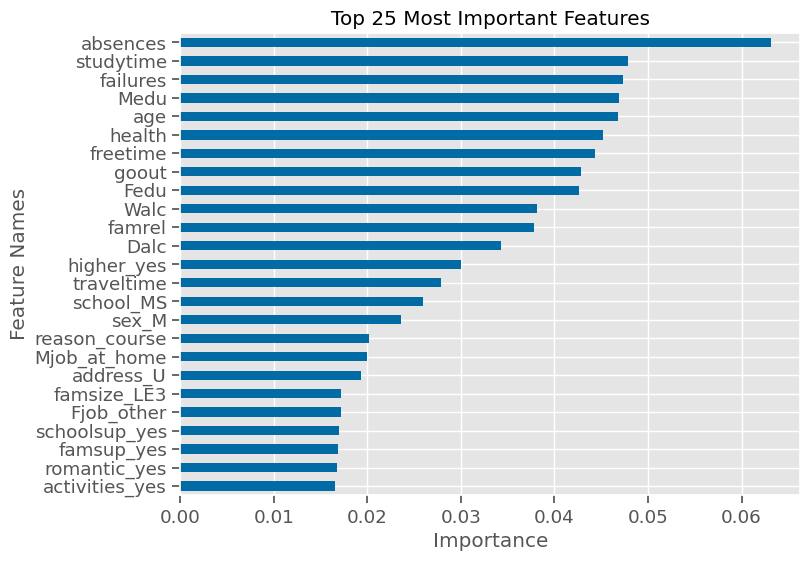

In [24]:
rf_importances = get_importances(rf_clf)
ax = plot_importance(rf_importances,top_n=25)

As we can see above, absences, studytime, failures, Medu, and age are the most important features, with many other features not too far behind.
As we discussed previously, built-in feature importances are biased towards considering numeric features as more important, so let's compare these importances to our Permutation Importance.
### Permutation Importances - RandomForest


In [25]:
from sklearn.inspection import permutation_importance
r = permutation_importance(rf_clf,X_train_df,y_train,n_jobs=-1,n_repeats=5)
r.keys()

dict_keys(['importances_mean', 'importances_std', 'importances'])

In [26]:
## getting the colors for the top 7 important rf features
colors_rf = get_color_dict(rf_importances,top_n=7)

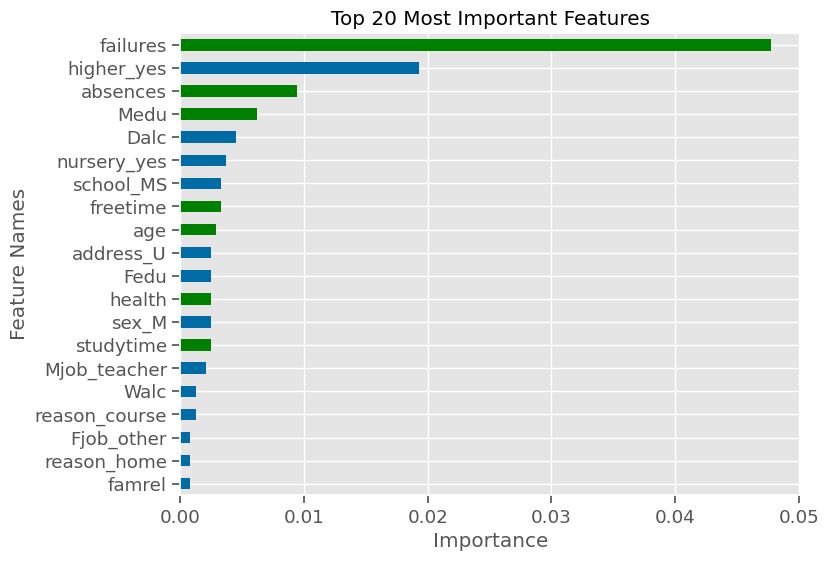

In [29]:
## can make the mean importances into a series
rf_perm_importances = pd.Series(r['importances_mean'],index=X_train_df.columns,
                           name = 'permutation importance')
rf_perm_importances = rf_perm_importances.sort_values(ascending=False)
plot_importance_color(rf_perm_importances,color_dict=colors_rf,top_n=20);

As we can see above, one of the features with the top 3 largest permutation importance were not in the random forest's top features:
higher_yes
As we previously discussed, built-in feature importance often overlooks categorical features. Our permutation importance, however, avoids this bias and it determined 1 out of the 3 most important features to be a categorical feature.
Also, as we discussed previously, neither feature importance nor permutation importance tells us the directionality of that feature vs the target.
higher_yes means that the student is planning to pursue higher education. We may suspect that being in this group leads to decreased likelihood of Failing, but we cannot say that for sure with just this information.

### Post-Modeling EDA
Let's combine all of our processed data back into 1 DataFrame for our final EDA.
This means we want to combine:
X_train and y_train (first),
X_test and y_test (second),
and then combine both of the above!

In [30]:
# Combining all data for eda post-modeling
plot_df_train = pd.concat([X_train_df, y_train],axis=1)
plot_df_test = pd.concat([X_test_df, y_test],axis=1)
plot_df = pd.concat([plot_df_train, plot_df_test])
plot_df

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes,target_F
54,15.0,3.0,3.0,1.0,1.0,0.0,5.0,3.0,4.0,4.0,4.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,False
208,16.0,2.0,3.0,2.0,1.0,0.0,5.0,3.0,3.0,1.0,1.0,3.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,True
23,16.0,2.0,2.0,2.0,2.0,0.0,5.0,4.0,4.0,2.0,4.0,5.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,True
547,16.0,4.0,1.0,1.0,1.0,0.0,4.0,1.0,2.0,2.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,True
604,18.0,1.0,1.0,3.0,2.0,1.0,4.0,4.0,2.0,1.0,2.0,2.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,17.0,1.0,1.0,1.0,3.0,0.0,4.0,3.0,3.0,1.0,1.0,3.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,False
454,16.0,1.0,2.0,1.0,3.0,1.0,1.0,3.0,2.0,1.0,2.0,4.0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,True
56,15.0,4.0,3.0,1.0,2.0,0.0,4.0,3.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,False
203,17.0,1.0,2.0,1.0,2.0,0.0,3.0,1.0,3.0,1.0,5.0,3.0,6.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,True


Now, let's do some quick exploration of the relationship between our target and the top 3 features.

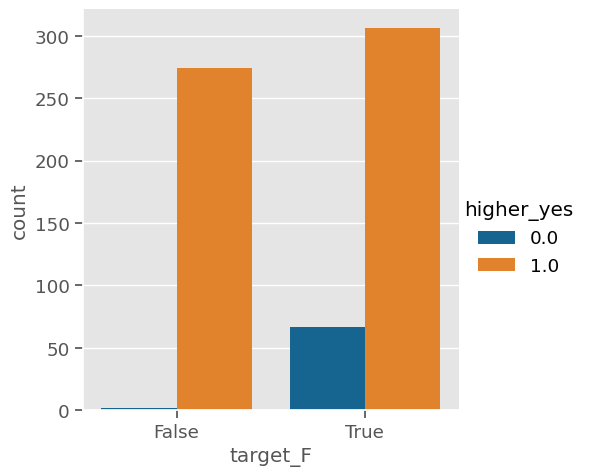

In [31]:
sns.catplot(data=plot_df, kind='count', x='target_F', hue='higher_yes');


As we can see with our EDA above, it looks like there are a higher proportion of students that are NOT pursuing higher education (blue group) in the Failing students (target_F==True) than the successful students.

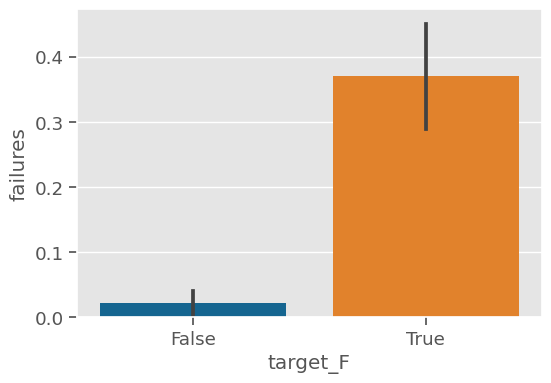

In [32]:
plt.figure(figsize=(6,4))
ax = sns.barplot(data=plot_df, x='target_F',y='failures')

We can see above that students who failed Portuguese had many more failures, on average.

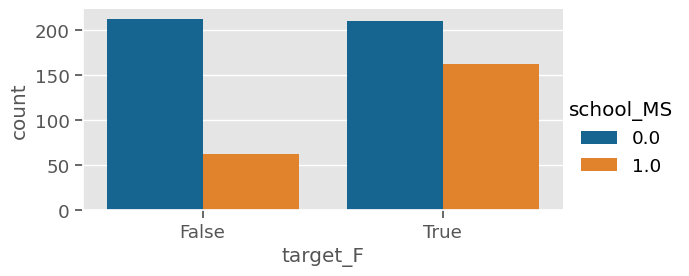

In [33]:
sns.catplot(data=plot_df, kind='count', x='target_F', hue='school_MS',
            aspect=2, height=3);

Summary
In this lesson, you converted a regression target to a classification target. This may or may not be appropriate depending on your stakeholder's needs. In this case, the classification model served our purpose and allowed us to develop a higher-performing model from which to gain insights. Now that we are working with a classification task, we will revisit regression coefficients in the next lesson, but this time it will be for Logistic Regression coefficients for classification.

# Logistic Regression Coefficients


In [34]:
def calc_lin_reg(x):
    return x*2.713 - .8

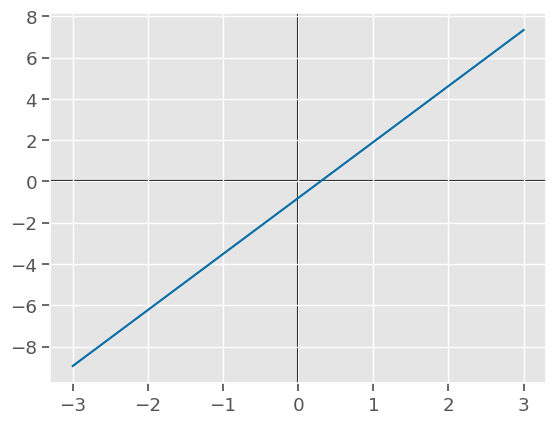

In [35]:
xs = np.linspace(-3,3)
ys = calc_lin_reg(xs)
def plot_xy(xs,ys):
    plt.plot(xs,ys)
    plt.axvline(0,color='k', zorder=0)
    plt.axhline(0, color='k', zorder=0)
plot_xy(xs,ys)

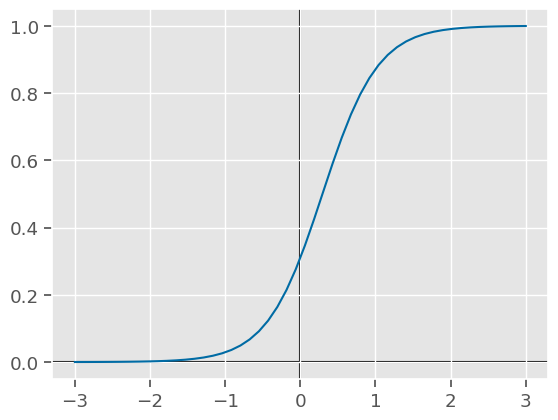

In [36]:
from math import e
def calc_sigmoid(ys):
    return 1/(1+e**-ys)
ys_sigmoid = calc_sigmoid(ys)
plot_xy(xs,ys_sigmoid)

## LogisticRegression in sklearn


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

       False       0.73      0.71      0.72       205
        True       0.79      0.81      0.80       281

    accuracy                           0.77       486
   macro avg       0.76      0.76      0.76       486
weighted avg       0.76      0.77      0.76       486



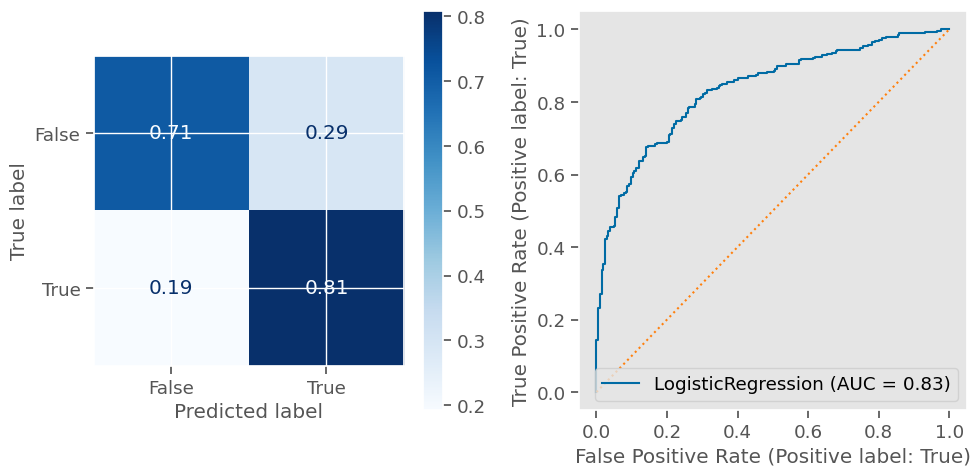

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

       False       0.73      0.69      0.71        71
        True       0.77      0.80      0.79        92

    accuracy                           0.75       163
   macro avg       0.75      0.75      0.75       163
weighted avg       0.75      0.75      0.75       163



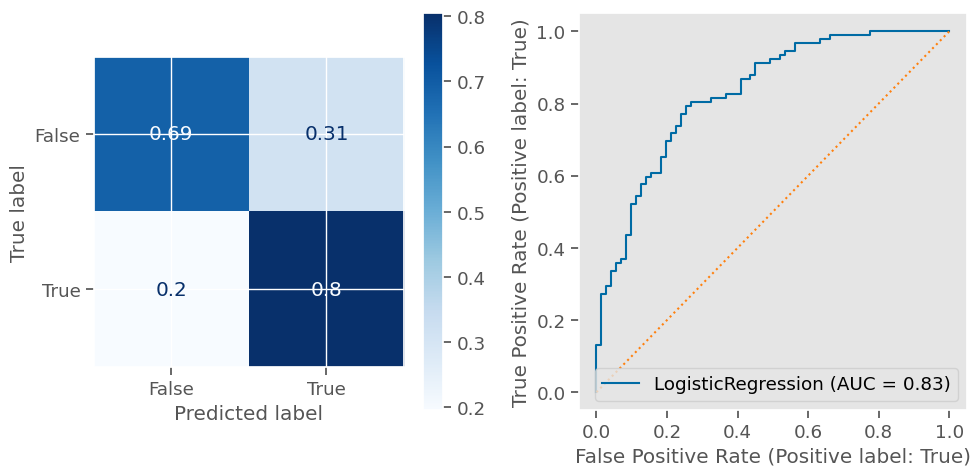

In [37]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train_df, y_train)
evaluate_classification(logreg,X_train_df,y_train, X_test_df,y_test)

In [42]:
try:
    get_coeffs_linreg(logreg)
except Exception as e:
    print("ERROR: ", e) 

ERROR:  Length of values (1) does not match length of index (43)


In [43]:
logreg.coef_

array([[-0.22006835, -0.18656296, -0.2154208 , -0.33705263, -0.37135291,
         1.39712192, -0.25645027,  0.10196875,  0.12237896,  0.43143587,
        -0.11748189,  0.13292964,  0.07234671,  0.62777626,  0.61205642,
        -0.32462958,  0.13820367,  0.19625127,  0.41638756, -0.35115234,
        -0.19710749,  0.01675313,  0.11514691, -0.30292436,  0.38010115,
         0.32620578,  0.29062611, -0.69398091,  0.16758475, -0.38941297,
         0.21961627,  0.00223972, -0.14276047, -0.05446664,  0.19725488,
         0.94179001,  0.13862419,  0.1247438 , -0.18637901, -0.07942583,
        -1.70464204, -0.07350188,  0.19208352]])

In [44]:
logreg.intercept_

array([6.26535316])

In [45]:
logreg.coef_[0]

array([-0.22006835, -0.18656296, -0.2154208 , -0.33705263, -0.37135291,
        1.39712192, -0.25645027,  0.10196875,  0.12237896,  0.43143587,
       -0.11748189,  0.13292964,  0.07234671,  0.62777626,  0.61205642,
       -0.32462958,  0.13820367,  0.19625127,  0.41638756, -0.35115234,
       -0.19710749,  0.01675313,  0.11514691, -0.30292436,  0.38010115,
        0.32620578,  0.29062611, -0.69398091,  0.16758475, -0.38941297,
        0.21961627,  0.00223972, -0.14276047, -0.05446664,  0.19725488,
        0.94179001,  0.13862419,  0.1247438 , -0.18637901, -0.07942583,
       -1.70464204, -0.07350188,  0.19208352])

In [46]:
logreg.intercept_[0]

6.265353163162884

In [47]:
def get_coeffs_logreg(logreg, feature_names = None, sort=True,ascending=True,
                      name='LogReg Coefficients', class_index=0):
    if feature_names is None:
        feature_names = logreg.feature_names_in_ 
    
    ## Saving the coefficients
    coeffs = pd.Series(logreg.coef_[class_index],
                       index= feature_names, name=name)
    
    # use .loc to add the intercept to the series
    coeffs.loc['intercept'] = logreg.intercept_[class_index]
    if sort == True:
        coeffs = coeffs.sort_values(ascending=ascending)  
    return coeffs

In [48]:
coeffs = get_coeffs_logreg(logreg)
coeffs

higher_yes          -1.704642
Fjob_teacher        -0.693981
reason_home         -0.389413
studytime           -0.371353
Mjob_health         -0.351152
traveltime          -0.337053
address_U           -0.324630
Fjob_at_home        -0.302924
famrel              -0.256450
age                 -0.220068
Fedu                -0.215421
Mjob_other          -0.197107
Medu                -0.186563
activities_yes      -0.186379
guardian_father     -0.142760
Walc                -0.117482
nursery_yes         -0.079426
internet_yes        -0.073502
guardian_mother     -0.054467
reason_reputation    0.002240
Mjob_services        0.016753
absences             0.072347
freetime             0.101969
Mjob_teacher         0.115147
goout                0.122379
paid_yes             0.124744
health               0.132930
famsize_LE3          0.138204
famsup_yes           0.138624
reason_course        0.167585
romantic_yes         0.192084
Pstatus_T            0.196251
guardian_other       0.197255
reason_oth

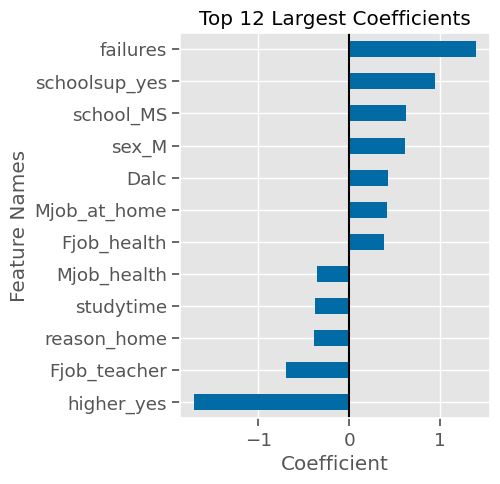

In [49]:
ax = plot_coeffs(coeffs,top_n=12)
 

## Comparing Linear and Logistic Regression Coefficients


Brief review of linear regression coefficients

Previously, when we interpreted the coefficients of our linear regression, we said that the coefficient for a feature represents how much our target will change for every increase of 1 unit in our feature.
E.g. For each failure, the final grade decreased by 1.295.
For OneHotEncoded features, increasing the value of that feature by 1 really meant how being in that category affected the target.
E.g. Intending to go to college (higher_yes ==1) increased the final grade by 1.695.
Introducing logistic regression coefficients

But now that our target is a classification, how do we interpret the meaning of logistic regression coefficients?
At the start of the lesson, we discussed how logistic regression converts a linear regression equation into an S-shaped (sigmoid) curve. We said the result is that the curve predicts a probability value between 0 and 1 instead of the actual score.
The coefficients of a logistic regression are the log odds, which we will convert to odds for interpretation and discuss in detail below.

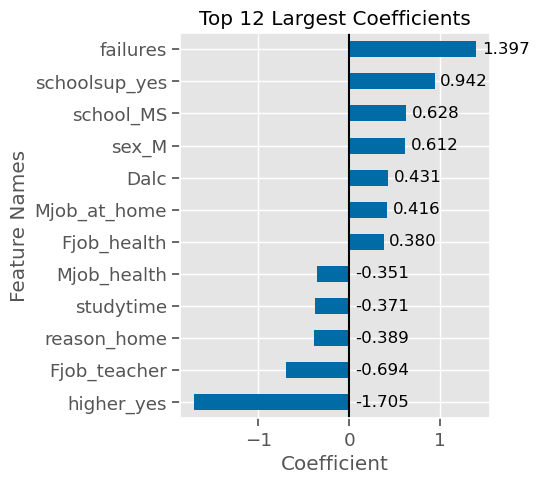

In [51]:
ax = plot_coeffs(coeffs,top_n=12,annotate=True)

### LogisticRegression Returns Log Odds Coefficents
### Converting Log-Odds to Odds


In [52]:
## logodds coeff for failures
coeffs.loc['failures']

1.397121922436006

In [53]:
## Raising e to the power of our logodds coeff 
import math
math.e**coeffs.loc['failures']

4.043545565982182

<AxesSubplot: title={'center': 'All Coefficients - Ranked by Magnitude'}, xlabel='Coefficient', ylabel='Feature Names'>

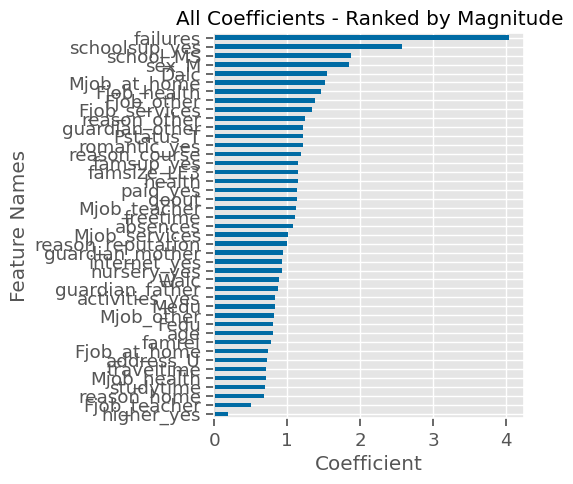

In [54]:
coeffs_odds = np.exp(coeffs)
plot_coeffs(coeffs_odds)

### Updating our function
Let's add a boolean argument for if we want to convert the log-odds into odds right away.

In [55]:
def get_coeffs_logreg(logreg, feature_names = None, sort=True,ascending=True,
                      name='LogReg Coefficients', class_index=0,  
                      include_intercept=False, as_odds=False):
    
    if feature_names is None:
        feature_names = logreg.feature_names_in_
        
    ## Saving the coefficients
    coeffs = pd.Series(logreg.coef_[class_index],
                       index= feature_names, name=name)
    
    if include_intercept:
        # use .loc to add the intercept to the series
        coeffs.loc['intercept'] = logreg.intercept_[class_index]
        
    if as_odds==True:
        coeffs = np.exp(coeffs)
    if sort == True:
        coeffs = coeffs.sort_values(ascending=ascending)
    
        
    return coeffs

In [56]:
coeffs_odds = get_coeffs_logreg(logreg, as_odds=True)
coeffs_odds

higher_yes           0.181837
Fjob_teacher         0.499583
reason_home          0.677454
studytime            0.689800
Mjob_health          0.703877
traveltime           0.713871
address_U            0.722795
Fjob_at_home         0.738655
famrel               0.773793
age                  0.802464
Fedu                 0.806202
Mjob_other           0.821102
Medu                 0.829806
activities_yes       0.829959
guardian_father      0.866962
Walc                 0.889157
nursery_yes          0.923647
internet_yes         0.929134
guardian_mother      0.946990
reason_reputation    1.002242
Mjob_services        1.016894
absences             1.075028
freetime             1.107349
Mjob_teacher         1.122038
goout                1.130182
paid_yes             1.132858
health               1.142170
famsize_LE3          1.148209
famsup_yes           1.148692
reason_course        1.182446
romantic_yes         1.211772
Pstatus_T            1.216833
guardian_other       1.218054
reason_oth

### Interpreting Odds
Odds are how much more likely to fall into the 1 class than the 0 class.
- A value of 1 means both classes are equally likely.
- A value > 1 means that the 1 class is more likely than the 0 class.
- A value < 1 means that the 1 class is less likely than the 0 class.
You've likely encountered odds in real-world situations/conversations.
"What are the odds that horse A will win the race over horse B?"
In other words, how many times more likely is horse A to win vs horse B?

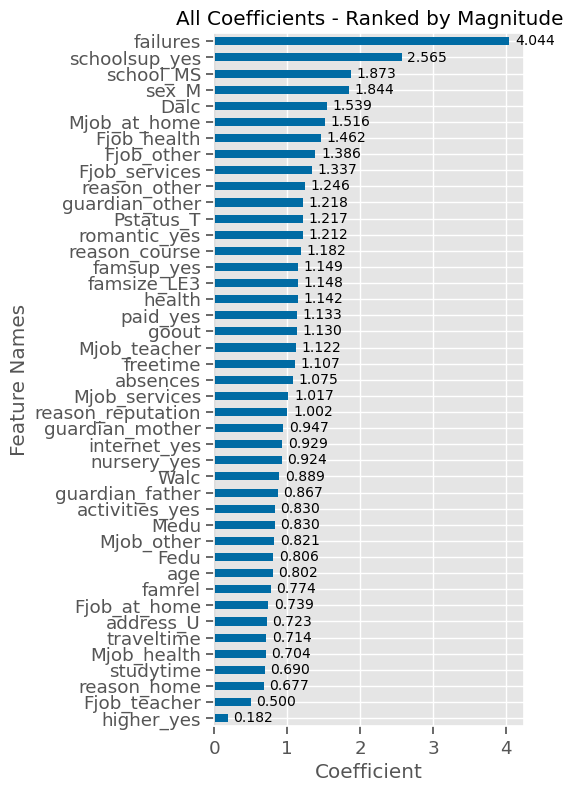

In [57]:
coeffs_odds = get_coeffs_logreg(logreg, as_odds=True)
ax = plot_coeffs(coeffs_odds,annotate=True,figsize=(4,9),size=10)

### Interpreting Odds Coefficients
“For every one-unit increase in [X variable], the odds that the observation is in (y class) are [coefficient] times as large as the odds that the observation is not in (y class) (when all other variables are held constant).”
Let's walk through interpreting some of our largest odds coefficients:
failures:
For every additional failure, the odds of a student failing is 4.043 times the odds of passing.
schoolsup_yes:
Getting (needing?) extra support from the school increases the odds of failing by 2.566
school_MS:
students who attend MS (and not GP) are 1.873 times more likely to fail.
sex_M:
male students are 1.844 times more likely to fail than female students.

Note About Odds being Positive

Now that we have odds coefficients, we no longer have any negative values.
This means that any of our negative log-odds coefficients (that decreased the chances of the failing) are now odds values less than 1.
In other words, we can no longer use the magnitude of the coefficients to determine the most impactful, since a very small coefficient will still represent a big change.
Looking back at our smallest odds coefficients, we can see that:
higher_yes:
students who intended to pursue higher education are .18 times more likely to fail (meaning they are much less likely to fail).
Or we could say that these students are .18 times less likely to fail.
Fjob_teacher:
having a father who is a teacher decreases the odds of failing by .5.
reason_home:
attending the school because it's close to their home decreases the odds of failing by .678 times.

## Presenting Logistic Regression Coefficients to Non-Technical Stakeholders
To help us digest and interpret the coefficients better, let's add a vertical line at 1 (where 1= equally likely of Failing or Passing).

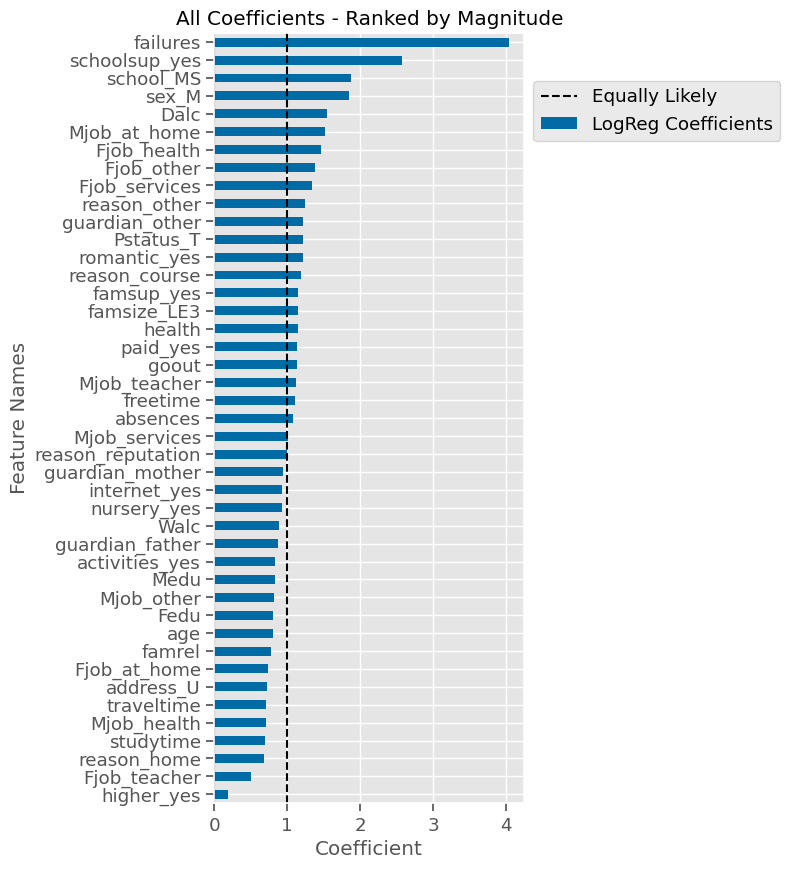

In [58]:
ax = plot_coeffs(coeffs_odds,annotate=False,figsize=(4,10))
ax.axvline(1, ls='--',label='Equally Likely',color='k', zorder=1)
ax.legend(bbox_to_anchor=[1,.95]);

When presenting a summary of your model's findings to a non-technical stakeholder, you can choose which version of the coefficients you show.
Depending on your comfort level for interpreting odds, you may want to leave the coefficients as log-odds to get a nice/clean positive value for each feature.

### Visualizing Odds Coefficients more effectively.
If you are comfortable explaining odds and use color-coding and/or a vertical line indicating the threshold between more/less likely, then using odds coefficients may work better for you.
To aid in the visual interpretation of Odds, we can color-code the values greater than 1 and less than 1.
See the next (optional) lesson for how to accomplish this yourself!

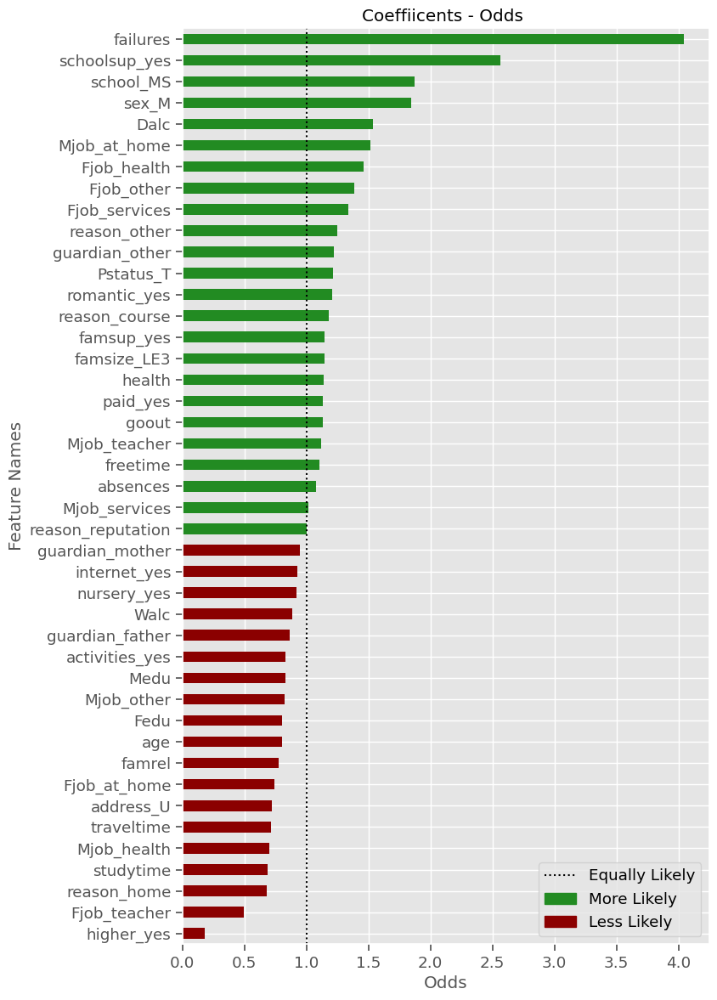

## Summary
In this lesson, we reviewed the extraction and interpretation of Logistic Regression coefficients.
The Logistic Regression coefficients provided more information about the directionality of the relationship between our features and our target.
However, our Logistic Regression did not perform as well as our RandomForest model.
It would be great if we had a tool that would allow us to get the directionality of the features effect on our model's predictions for all models, not just Logistic Regression model.
There is indeed such a tool! Which we will explore in the next lesson.

In [59]:
colors_dict = {}
for i in coeffs.index:
    rounded_coeff = np.round( coeffs.loc[i],3)
    if rounded_coeff < 1:
        color = 'darkred'
    elif rounded_coeff > 1:
        color = 'forestgreen'
    else:
        color= 'gray'
    colors_dict[i] = color
    
## previewing example >1 and <1
colors_dict['failures'],colors_dict['higher_yes']

('forestgreen', 'darkred')

In [60]:
def get_colors_gt_lt(coeffs, threshold=1, color_lt ='darkred',
                     color_gt='forestgreen', color_else='gray'):
    """Creates a dictionary of features:colors based on if value is > or < threshold"""
    colors_dict = {}
    for i in coeffs.index:
        rounded_coeff = np.round( coeffs.loc[i],3)
        if rounded_coeff < threshold:
            color = color_lt
        elif rounded_coeff > threshold:
            color = color_gt
        else:
            color=color_else
        colors_dict[i] = color
    return colors_dict

In [61]:
def plot_coeffs_color(coeffs, top_n=None,  figsize=(8,6), color_dict=None,
                   plot_kws = {}):
    """Plots series of coefficients
    
    Args:
        ceoffs (pands Series): importance values to plot
        top_n (int): The # of features to display (Default=None). 
                        If None, display all.
                        otherwise display top_n most important
                        
        figsize (tuple): figsize tuple for .plot
        color_dict (dict): dict with index values as keys with color to use as vals
                            Uses series.index.map(color_dict).
        plot_kws (dict): additional keyword args accepted by panda's .plot
                            
    Returns:
        Axis: matplotlib axis
        """
    
    # sorting with asc=false for correct order of bars
    
    if top_n is None:
        ## sort all features and set title
        plot_vals = coeffs.sort_values()
        title = "All Coefficients"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        ## sort features and keep top_n and set title
        title = f"Top {top_n} Largest Coefficients"
        
    ## plotting top N importances
    if color_dict is not None:
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        plot_kws.update({'color':colors})
        
    ax = plot_vals.plot(kind='barh', figsize=figsize,**plot_kws)
    ax.set(xlabel='Coefficient', 
           ylabel='Feature Names', 
           title=title)
    
    ## return ax in case want to continue to update/modify figure
    return ax

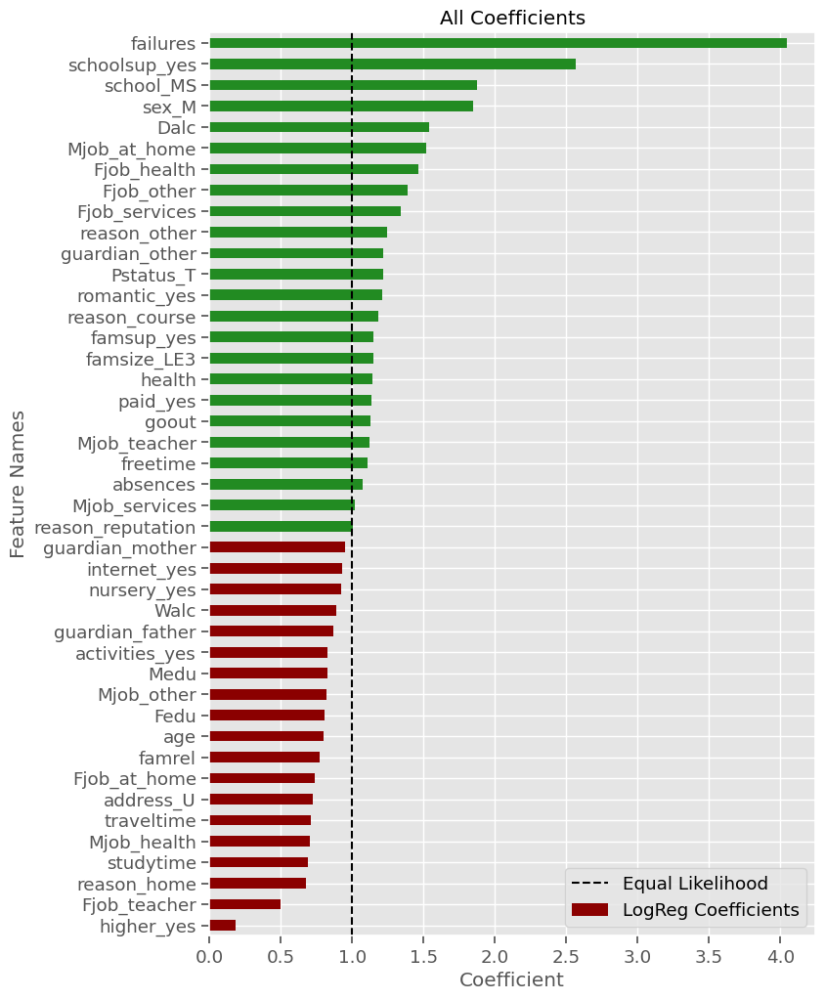

In [62]:
colors_odds = get_colors_gt_lt(coeffs_odds,threshold=1)
ax = plot_coeffs_color(coeffs_odds,color_dict=colors_odds,figsize=(8,12))
ax.axvline(1, ls='--',label='Equal Likelihood',color='k',
          zorder=1)
ax.legend();

# SHAP Model Explainers - Global


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       205
        True       1.00      1.00      1.00       281

    accuracy                           1.00       486
   macro avg       1.00      1.00      1.00       486
weighted avg       1.00      1.00      1.00       486



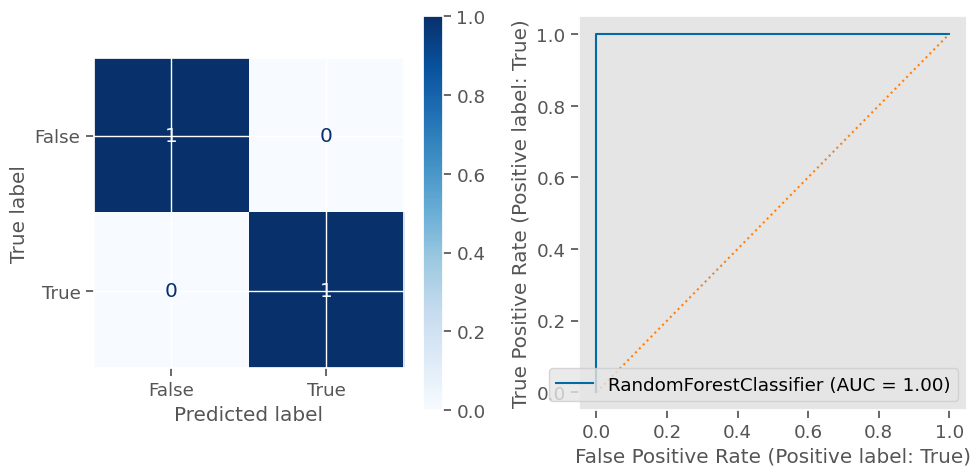

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

       False       0.81      0.70      0.75        71
        True       0.79      0.87      0.83        92

    accuracy                           0.80       163
   macro avg       0.80      0.79      0.79       163
weighted avg       0.80      0.80      0.80       163



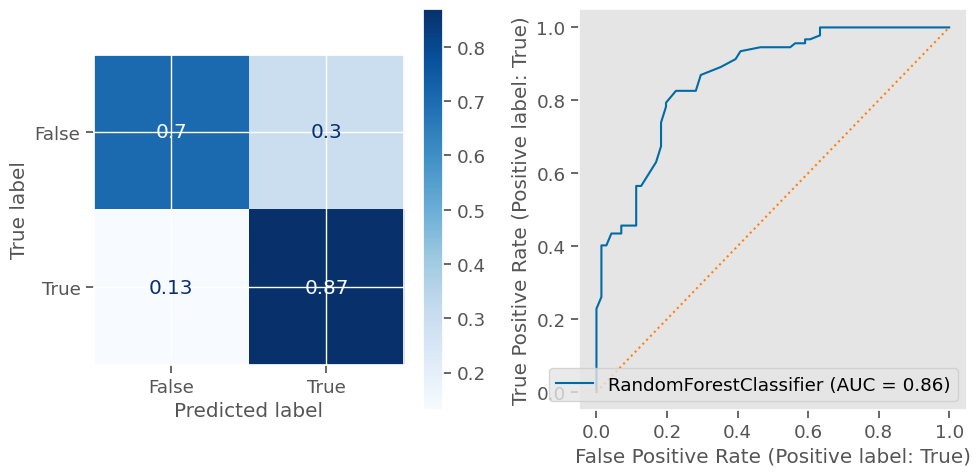

In [63]:
evaluate_classification(rf_clf,X_train_df,y_train, X_test_df,y_test)

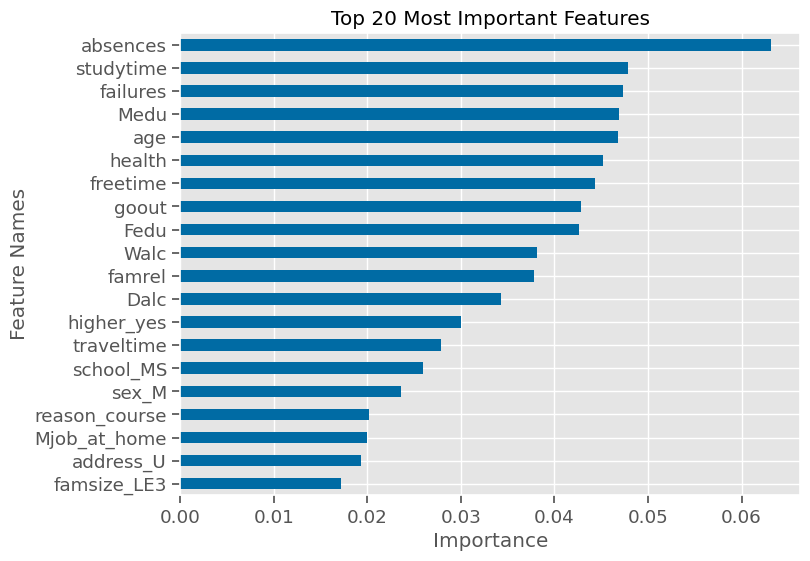

In [64]:
rf_importances = get_importances(rf_clf)
plot_importance(rf_importances,top_n=20);

In [65]:
# Import shap and initialize javascript:
import shap
shap.initjs()

In [66]:
len(X_train_df)


486

In [67]:
X_shap = shap.sample(X_train_df,nsamples=400,random_state=321)
X_shap.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
473,16.0,2.0,1.0,2.0,1.0,0.0,2.0,4.0,3.0,2.0,3.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0
340,17.0,3.0,3.0,1.0,1.0,0.0,4.0,4.0,3.0,1.0,3.0,5.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
452,16.0,2.0,2.0,3.0,2.0,0.0,4.0,4.0,5.0,1.0,1.0,4.0,4.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
555,16.0,1.0,2.0,1.0,3.0,0.0,4.0,3.0,4.0,1.0,1.0,3.0,5.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
70,16.0,3.0,1.0,2.0,4.0,0.0,4.0,3.0,2.0,1.0,1.0,5.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0


In [68]:
## get the corresponding y-values
y_shap = y_train.loc[X_shap.index]
y_shap 

473     True
340    False
452     True
555    False
70      True
       ...  
485     True
329    False
251     True
434     True
568     True
Name: target_F, Length: 400, dtype: bool

### Explaining Our RandomForest
SHAP has several types of model explainers that are optimized for different types of models.
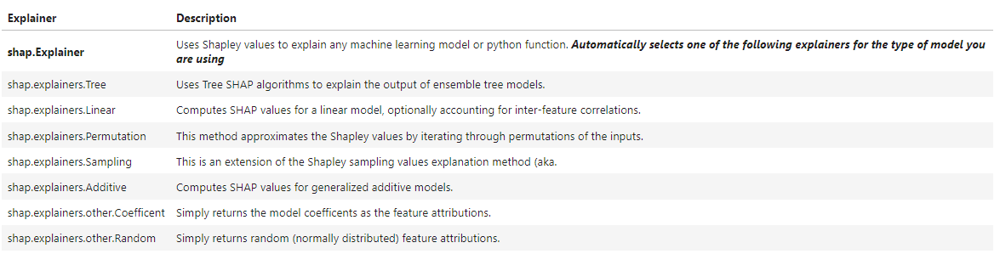

### 1. Create a SHAP explainer using your fit model

In [69]:
explainer = shap.Explainer(rf_clf)
explainer

### 2. Get SHAP values from explainer for your training data



In [70]:
## Getting the shap values
shap_values = explainer(X_shap,y_shap)
type(shap_values)

shap._explanation.Explanation

In [71]:
X_shap.shape


(400, 43)

In [72]:
shap_values.shape


(400, 43, 2)

In [73]:
shap_values[0]

.values =
array([[-1.15165368e-02,  1.15165368e-02],
       [-2.00970183e-02,  2.00970183e-02],
       [-3.73278511e-02,  3.73278511e-02],
       [-1.30577180e-02,  1.30577180e-02],
       [-6.02032650e-02,  6.02032650e-02],
       [ 1.82659012e-02, -1.82659012e-02],
       [-2.60672307e-02,  2.60672307e-02],
       [-5.23592261e-03,  5.23592261e-03],
       [-1.03872516e-02,  1.03872516e-02],
       [-2.83196172e-02,  2.83196172e-02],
       [-2.07484363e-02,  2.07484363e-02],
       [-5.73616057e-03,  5.73616057e-03],
       [-1.13086674e-02,  1.13086674e-02],
       [-4.39675434e-02,  4.39675434e-02],
       [-3.55386270e-02,  3.55386270e-02],
       [ 1.27171520e-03, -1.27171520e-03],
       [-5.32930678e-03,  5.32930678e-03],
       [-2.30715695e-03,  2.30715695e-03],
       [-4.69512766e-02,  4.69512766e-02],
       [-1.45327285e-03,  1.45327285e-03],
       [-5.67660591e-03,  5.67660591e-03],
       [-3.72593331e-04,  3.72593331e-04],
       [-2.87157566e-03,  2.87157566e-03],
 

In [74]:
## Brenda: which name to use?
# shap_vals_fail = shap_values[:,:,1]
shap_vals_1 = shap_values[:,:,1]
shap_vals_1.shape

(400, 43)

In [75]:
pd.DataFrame(shap_vals_1.values, columns = X_shap.columns)


,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
0,0.011517,0.020097,0.037328,0.013058,0.060203,-0.018266,0.026067,0.005236,0.010387,0.028320,0.020748,0.005736,0.011309,0.043968,0.035539,-0.001272,0.005329,0.002307,0.046951,0.001453,0.005677,0.000373,0.002872,-0.000225,0.000057,-0.001143,0.000815,0.005247,0.015226,0.004208,-0.001029,0.007523,0.000662,0.001909,0.000386,-0.001690,0.007628,-0.000286,0.002959,-0.001125,-0.010127,-0.000757,-0.001594
1,-0.027303,-0.009091,-0.031383,-0.010162,0.049549,-0.033083,-0.014626,-0.004118,0.003253,-0.031235,0.004435,0.017833,-0.049344,-0.040682,0.025022,-0.011379,-0.003799,0.002595,-0.017070,-0.035362,-0.001404,-0.003323,-0.007938,-0.001239,-0.001395,-0.010251,-0.006474,0.003280,-0.015919,-0.028659,-0.004538,0.004828,-0.003888,-0.007049,0.000052,-0.006882,0.005054,-0.004694,-0.004045,-0.008982,-0.023219,-0.001126,-0.002661
2,0.017169,0.032987,0.019626,-0.015481,0.007520,-0.026687,-0.007202,0.025579,0.040698,-0.015929,0.001173,0.003841,0.025080,0.080948,-0.011251,0.038092,0.007363,0.001380,-0.007668,0.002596,-0.005117,0.001234,0.003561,-0.000647,-0.000297,0.021454,0.013906,0.004540,0.027574,0.004750,-0.001471,0.007297,0.004914,0.005234,-0.000168,-0.001349,0.007637,-0.000833,0.007627,0.004793,-0.014682,0.000407,-0.006618
3,0.001809,-0.001358,-0.001983,0.008710,-0.099199,-0.034132,-0.010260,-0.004445,-0.006709,-0.023644,-0.010326,-0.008269,0.007948,0.008614,-0.017645,-0.004299,-0.001429,0.001784,-0.011344,0.001983,-0.005672,-0.001386,-0.000014,-0.000376,-0.001226,0.005254,0.002630,0.001950,-0.022413,-0.033509,-0.004206,-0.005627,-0.008104,-0.006877,-0.001257,0.010184,-0.002114,-0.001120,0.000369,-0.008371,-0.018657,-0.017193,0.005509
4,0.023117,0.035304,0.043111,0.002672,-0.006079,-0.025589,0.000259,0.027685,-0.012348,-0.006155,-0.003187,0.038435,0.014096,-0.001177,0.052577,-0.004504,-0.000448,0.004517,-0.001922,0.003276,0.005726,0.001250,0.002838,0.000213,-0.000518,0.014882,0.004071,0.003847,-0.005173,0.007281,-0.000556,-0.010176,0.011737,0.022177,-0.000538,-0.005201,0.006749,-0.001681,0.017924,-0.002532,-0.014325,0.000894,0.001052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,-0.005944,0.032713,0.010837,0.017512,0.015403,-0.029194,-0.008268,0.002200,0.033450,-0.012353,-0.001753,0.003920,-0.033018,0.076793,-0.018266,0.044056,0.004954,0.003984,0.049728,0.004451,0.009985,0.006397,0.003805,-0.000098,0.000057,0.006940,0.001221,0.003836,0.026492,0.006006,-0.000313,0.004812,0.004523,0.001943,-0.000272,-0.002883,0.011984,-0.000758,-0.000626,0.000846,-0.015745,-0.000426,-0.005350
396,-0.032286,0.007996,-0.006788,-0.004848,-0.028363,-0.036994,-0.019997,0.003082,-0.010410,-0.025484,-0.019203,0.013089,0.035533,-0.035958,-0.025918,-0.019437,-0.001882,0.002458,-0.013930,0.003163,-0.018483,-0.005339,0.000345,-0.000950,-0.000626,0.001183,-0.000436,0.001897,0.004315,-0.002029,-0.001586,0.007717,-0.001411,-0.002327,-0.001202,-0.006209,-0.004485,-0.001636,-0.002966,-0.009947,-0.019903,-0.008036,-0.018128
397,0.022906,0.043701,0.045876,0.008123,0.065592,-0.020319,-0.007152,0.059772,-0.015232,-0.008339,0.005327,0.051061,0.011300,-0.023666,0.002258,0.000582,0.002345,-0.000007,-0.007452,0.003360,0.000645,0.002900,0.001926,0.000280,-0.000540,0.003650,0.005691,0.002209,0.004935,-0.011772,-0.001979,0.011892,0.000771,0.002492,0.000673,-0.003171,-0.004975,-0.000165,0.010768,-0.001453,-0.016682,0.001947,0.013505
398,0.011959,0.013783,0.016340,-0.002397,-0.047356,-0.021644,0.065

### Summary Plot - Bar
First, let's examine a simple version of our SHAP values.
By using the plot_type="bar" version of the summary plot, we get something that looks very similar to the feature importances we discussed previously.
The bar plot summary shows the average of the SHAP value for each feature across all samples.

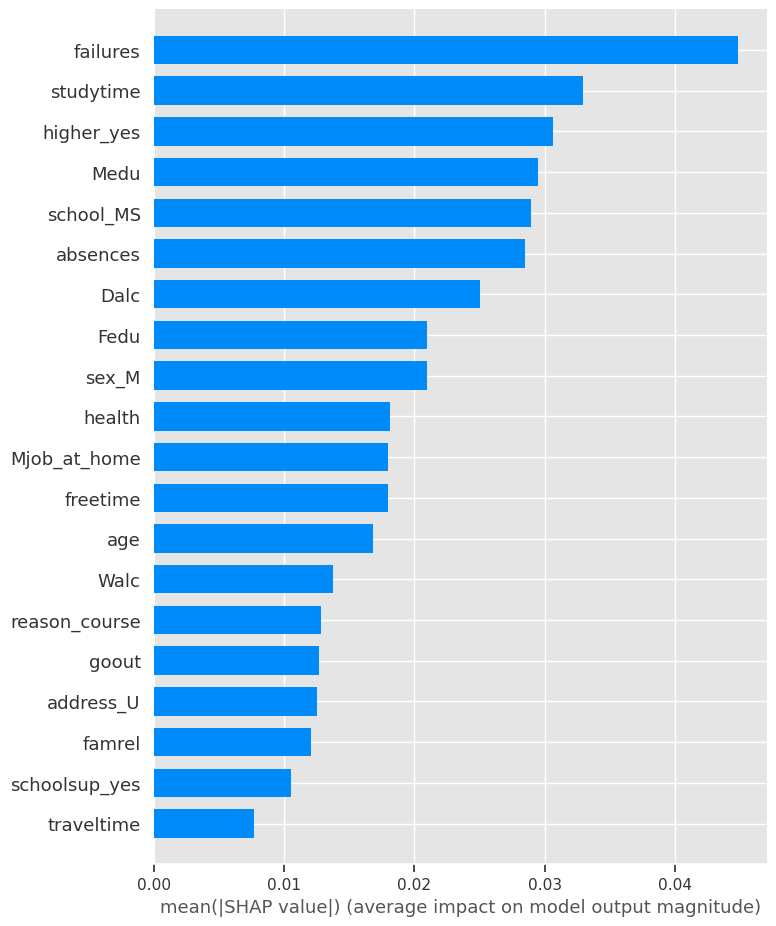

In [76]:
shap.summary_plot(shap_vals_1,features= X_shap, plot_type='bar')


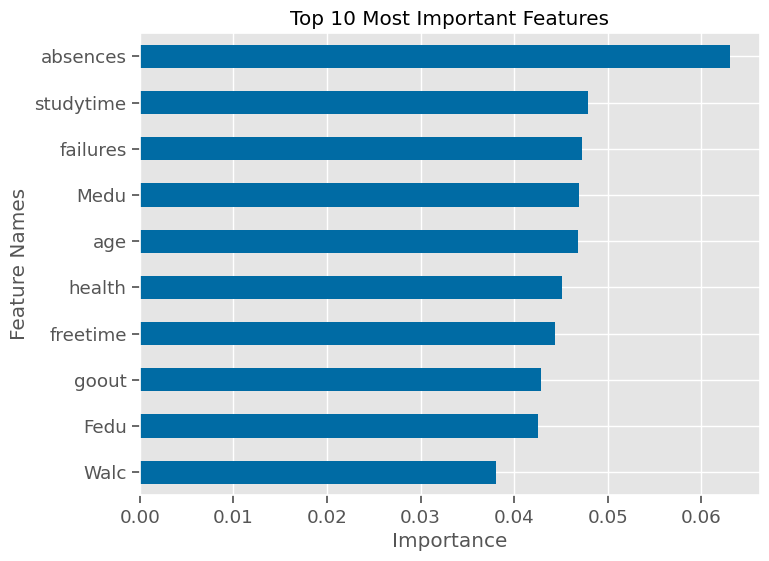

In [77]:
plot_importance(rf_importances,top_n=10);


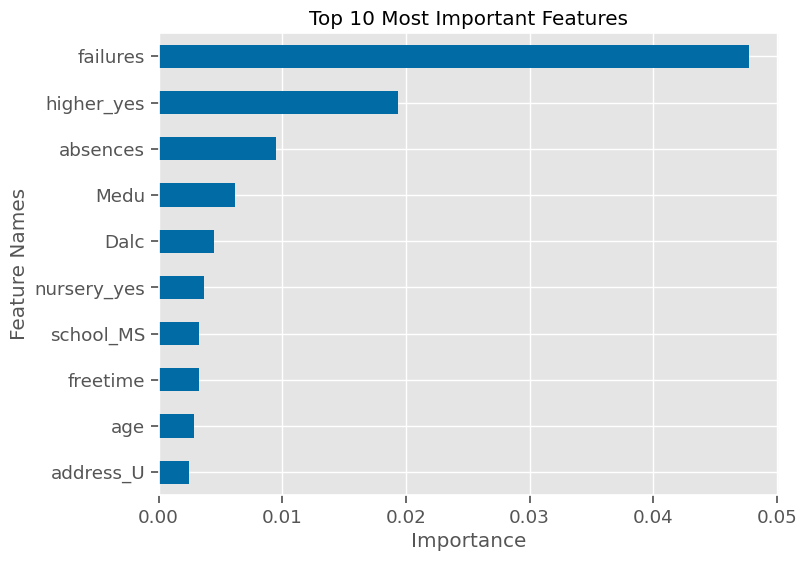

In [78]:
plot_importance(rf_perm_importances,top_n=10);


### Summary Plot - dot (default)
Now, let's examine the "dot" version of the summary plot.
By removing the plot_type argument, we are using the default, which is "dot".
Alternately, we could explicitly specify plot_type="dot".
There are also additional plot types that we will not be discussing in this lesson (e.g. "violin","compact_dot")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


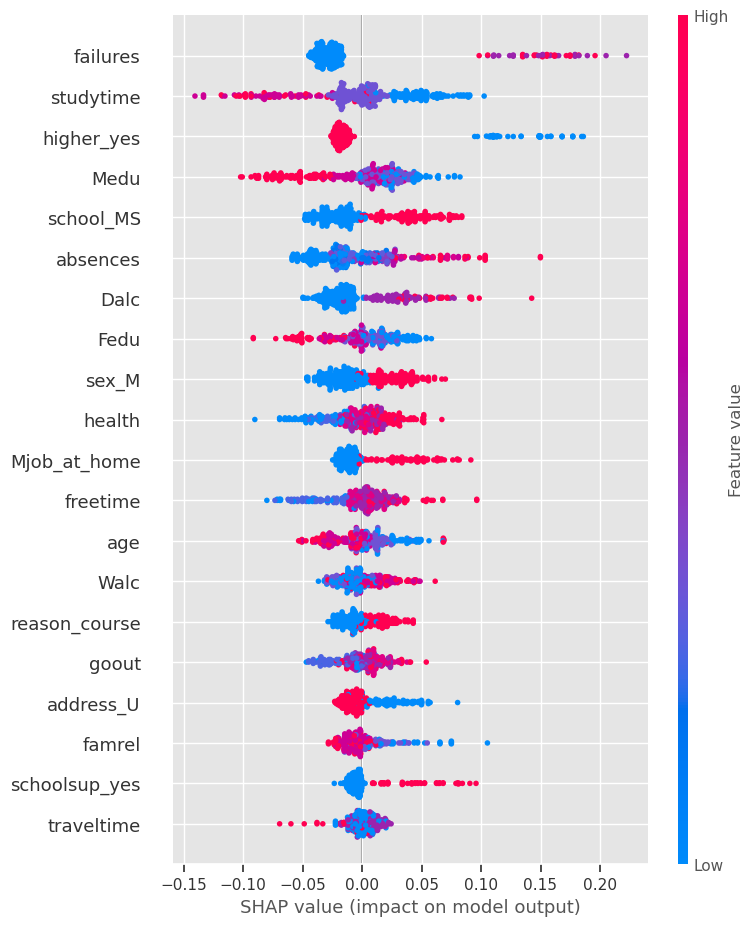

In [80]:
shap.summary_plot(shap_vals_1,X_shap)


Now THAT is a lot more nuanced of a visualization! Let's break down how to interpret the visual above.

### Reading SHAP Summary Plots

In the summary plot above:
Each dot represents an observation/row (in this case, a student).
The features are plotted on the y-axis and are sorted from the most impactful features to the least (from top to bottom).
The calculated Shapley values for each observation are plotted on the x-axis. The more positive the value, the more the feature pushed the model's prediction towards predicting the current class (failing).
For each feature, the original values of that feature are represented with color.
Using the default colormap, blue represents the lowest value in the column and red represents the highest.
For one hot encoded categories, blue=0, red = 1.
For numeric features: the shade of the color indicates where it falls in the feature's distribution.
Let's just follow the red dots for each feature. Red means the feature value is higher.
If the red is on the right (positive), higher values of this feature increase the chance the prediction will be fail.
If the red is on the left (negative), higher values of this feature decrease the chances the prediction will be fail.
A quick glance above shows that failures and higher_yes are both very important, but they have opposite impacts. According to our model, higher values for failures increases the chance of failing Portuguese, whereas, higher values for higher_yes (1 since it is categorical) decreases the chance of failing.

It can take a bit of time to acclimate to this graph. Let's talk through some examples in detail.

### Interpreting the SHAP values for our model:
failures
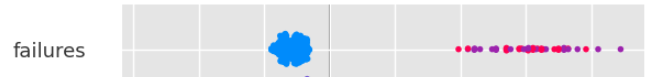
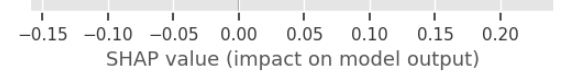

### Failures had the largest effect on the model's predictions (since it was the first bar at the top of the graph).

Because red values are on the right (positive), we can see that the greater the number of failures a student had, the more likely the model would predict the student will Fail.
We can see that having a high number of failures pushed the model's prediction heavily towards being a failure (as judged by how far to the right of the yaxis/0-line the red samples are located).
Notice that the blue dots (fewer failures) are only slightly to the left of the 0-line, indicating that the model is only slightly less likely to predict a failure, compared to the big impact of having a large number of failures.
### studytime
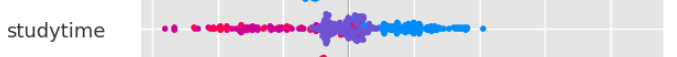
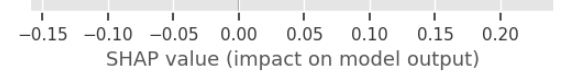
### higher_yes
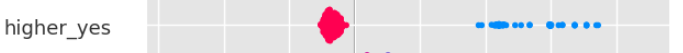
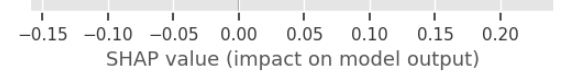
The red values are on the left (negative) so that if higher_yes==1 (meaning the student wants to pursue higher education), then the model is much LESS likely to predict failure.
If higher_yes==0 (the blue dots), the model is more likely to predict the student will fail.
### Important Note
Remember, our SHAP explanations and visualizations are explaining how our model was using the features and how they influenced the model's prediction.
It is not explaining the real-world situation. So always keep that in mind when interpreting SHAP visualizations.
### Summary
This lesson showed you how to obtain, visualize, and interpret SHAP values. SHAP's explanations provide a much more detailed and nuanced perspective on how our model is making its predictions. While the summary plots can be a little tricky to read at first, with just a little practice, you should find it much easier.

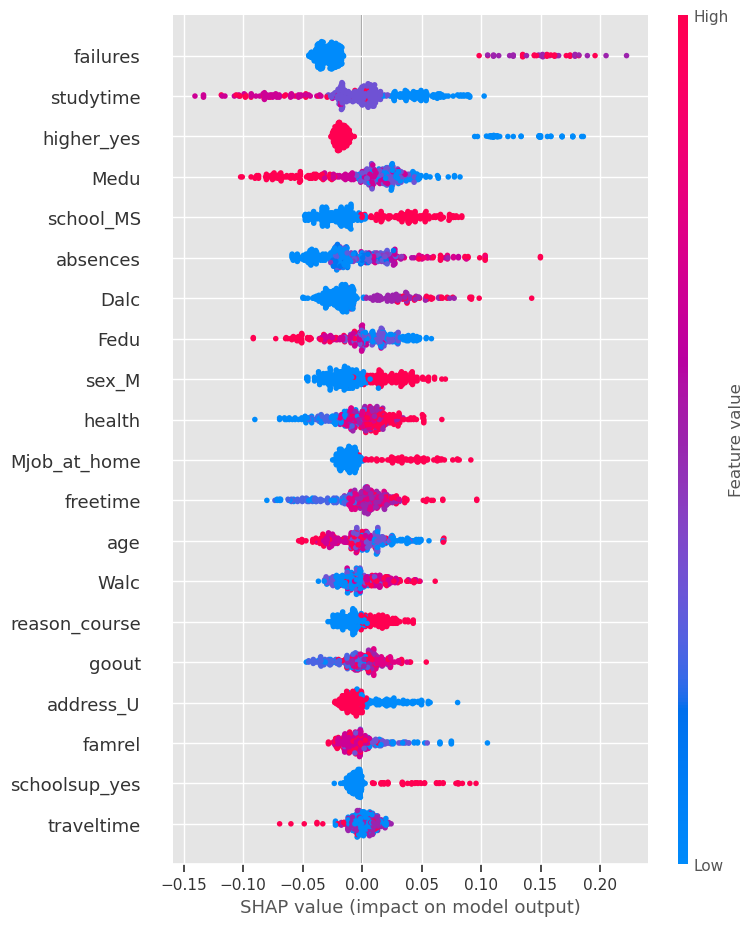

In [81]:
fig, ax = plt.subplots()
shap.summary_plot(shap_vals_1,X_shap)
ax.set_title('Summary Plot - Class=Fail');

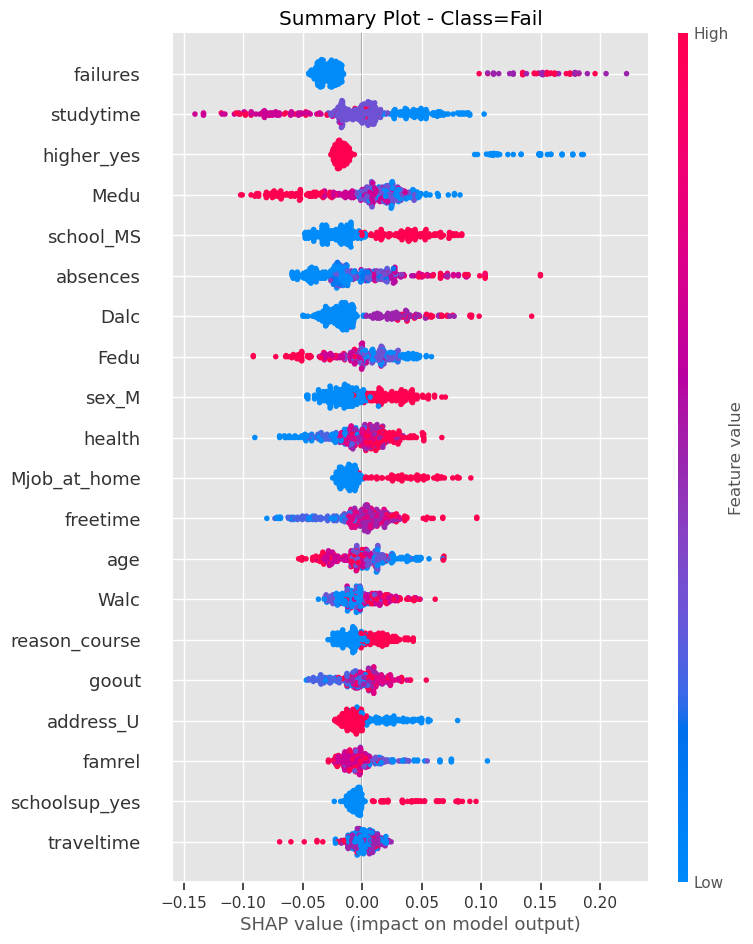

In [82]:
fig


In [83]:
import os
os.makedirs("images/", exist_ok=True)

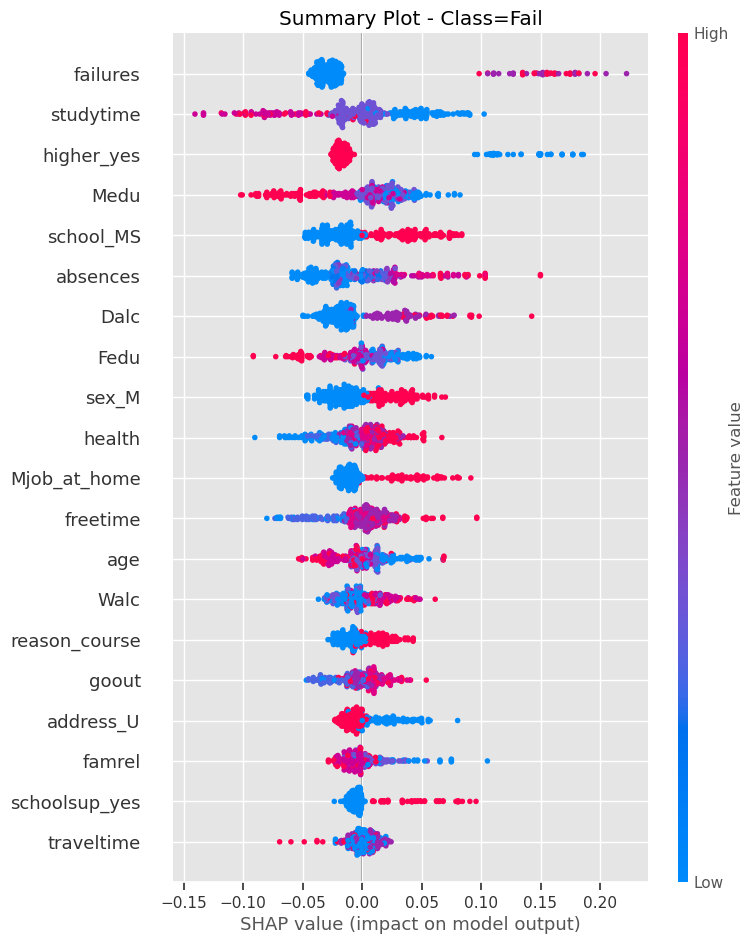

In [84]:
fig, ax = plt.subplots()
shap.summary_plot(shap_vals_1, X_shap, show=False)
ax.set_title('Summary Plot - Class=Fail');
fig.savefig('images/summary_plot_1.png')

Now, let's insert this image into a markdown cell.
The most flexible way to insert an image is to use an html img tag.
Image tags need the filepath as the "src" argument.
We can also add additional style arguments to do things like resize our figure with the width argument. Below we are resizing to 60% of its original size.

<img src="images/summary_plot_1.png" width=60%>

We could also use exact pixel values. We would use the letters "px" to indicate the units.

<img src="images/summary_plot_1.png" width=400px>

We can also control the plot alignment. We are centering the visualization below:
## Summary
This lesson showed you how to save your SHAP visualizations as image files. It then showed you how to insert the image into your README using the HTML img tag to control the size/alignment of the image.

# SHAP Force Plots


In [85]:
# arbitrarily choosing a row to use
i = 100
single_row_X = X_shap.iloc[i]
single_row_y = y_shap.iloc[i]
single_shap_vals = shap_vals_1[i]
single_row_X.head(10)

age           17.0
Medu           4.0
Fedu           3.0
traveltime     2.0
studytime      2.0
failures       0.0
famrel         4.0
freetime       4.0
goout          4.0
Dalc           4.0
Name: 189, dtype: float64

In [86]:
## true class of selected row
single_row_y

True

Note: Because force_plot is interactive, it requires javascript (shap.initjs()) and that you must Trust your Jupyter notebook in order to display it. - In the top right corner of Jupyter notebook, next the kernel name (Python (dojo-env)), click the Not Trusted button to trust the notebook.
To create a force plot, the function requires:
the expected_value (base value) for the class of interest - which we can find in our explainer.
The SHAP values for just that row and the features for just that row.
The features (X data) for just the 1 row.

In [87]:
## Individual forceplot (with the complex shap vals)
shap.force_plot(explainer.expected_value[1],shap_values=single_shap_vals.values,
               features=single_row_X)

## Interpreting an individual Force Plot (Example 1)
In the visual above, we can see:

A number line at the top of the visual (with the base value labeled).
Here the base value is 0.5764.
A bold value at the intersection of the red and blue is the final SHAP value for the observation.
Here the SHAP value is .81
The red and blue segments with arrows towards the middle are "pushing" against each other.
Visually, the color with the wider bar "wins", and this decides the prediction. In this case, the contributions of the red features are greater than the blue which means a greater "push" towards failing, so the final prediction is class 1: failing.
The red features push the prediction to a greater value (towards class 1: failing), while the blue features push the prediction to a lower value (towards class 0: passing).
The wider the segment is for the feature, the greater its contribution to the prediction is.
As you can see, Dalc (workday alcohol consumption) is the most important feature for this student. Further, the actual value for each feature is listed. For this student, Dalc = 4 (on an ordinal scale from 1-5).
Many of the feature names are displayed, but the features that had smaller contributions do not display their name by default. If you hover your mouse over the features in your Jupyter notebook, you can see their names and values.

### Another Example of a Single Observation
Let's select another observation at random:


In [88]:
# arbitrarily choosing a row to use
i = 200
single_row_X = X_shap.iloc[i]
single_row_y = y_shap.iloc[i]
single_shap_vals = shap_vals_1[i]
single_row_X.head(10)

age           18.0
Medu           2.0
Fedu           2.0
traveltime     2.0
studytime      4.0
failures       0.0
famrel         4.0
freetime       4.0
goout          4.0
Dalc           1.0
Name: 390, dtype: float64

In [89]:
## true class of selected row
single_row_y

False

In [90]:
shap.force_plot(explainer.expected_value[1],shap_values=single_shap_vals.values,
               features=single_row_X)

### Interpreting an individual Force Plot (Example 2)
In the visual above, we can see:

A number line at the top of the visual (with the base value labeled)
Here the base value is 0.5764
Note, this value is the same for every observation
A bold value at the intersection of the red and blue is the final SHAP value for the observation.
Here the SHAP value is .15 (Note: this is much lower than our first example)
The red and blue segments with arrows towards the middle are "pushing" against each other.
The red features push the prediction to a greater value (towards class 1: failing), while the blue features push the prediction to a lower value (towards class 0: passing).
The wider the segment is for the feature, the greater its contribution to the prediction is.
As you can see, studytime is the most important feature for this student. Further, the actual value for each feature is listed. For this student, studytime = 4 (which corresponds to >10 hours per week).
Visually, the color with the wider bar "wins", and this decides the prediction. In this case, the contributions of the blue features are much greater than the red which means a greater "push" towards passing, so the final prediction is class 0: passing.
## Global shap.force_plot
To show a global force plot, we will use the entire set of SHAP values and our X_shap variable, instead of a single observation.

In [91]:
## Global Forceplot
shap.force_plot(explainer.expected_value[1],shap_vals_1.values,features=X_shap)

Now, the above visualization may look a little overwhelming at first, but it isn't as bad as it seems if we remember how to read our individual force plot.
In the individual example, we had the effect of the features on 1 row's prediction displayed horizontally, with the features color-coded based on their influence on the final prediction.
The global force plot is essentially individual force plots (but for each row) rotated 90 degrees.
Additionally, the force plot rearranged the rows in the data to sort them by similar values.
This is why we see such a strong pattern in the example above.
### Using the Interactive Features of the Force Plot
Hovering over the figure will display the feature names and values.
There are 2 drop down boxes (one on each axis) that control the values being displayed.

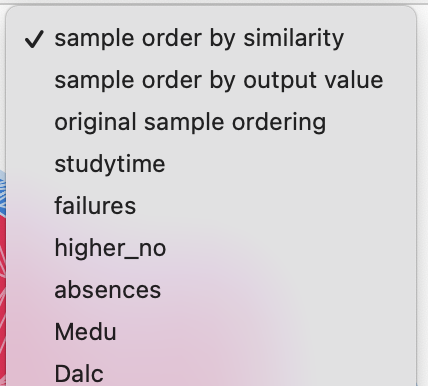
The top drop-down menu along the x-axis controls the sorting of the rows.
The default sorting based on similarity is generally going to be the cleanest sorting to interpret.
As we can see below, sorting by the original order makes it very difficult to read the visual.
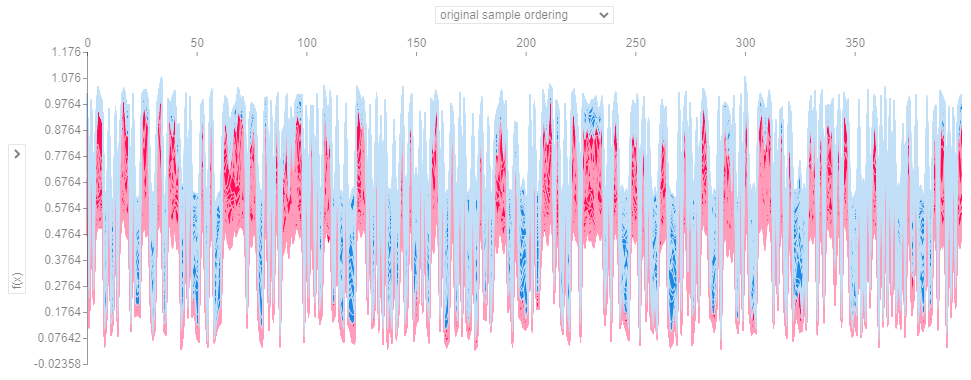
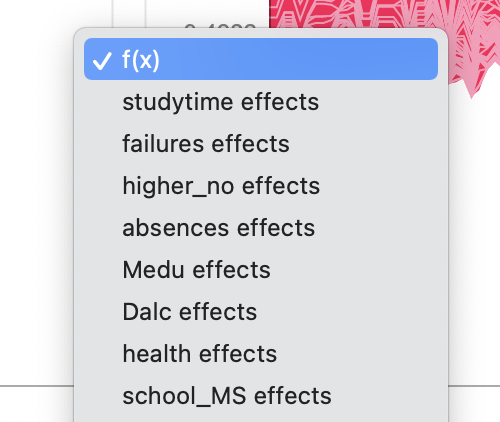
The left dropdown menu along the y-axis controls what values are being plotted.
By default, its plotting the overall output SHAP values, like in our individual force plot.
We can select an individual feature from this drop down to visualize only the effects of the one feature.

Here we take a closer look at studytime:

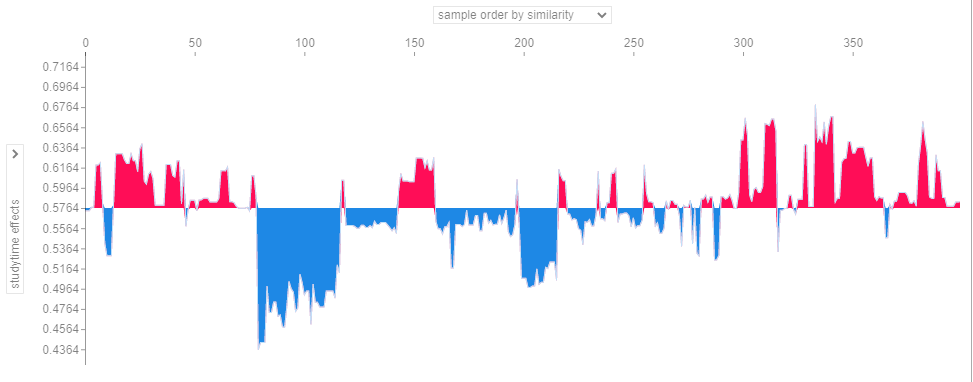

Summary
In this lesson, we learned how to produce and interpret SHAP's force plots that provide additional insights and explanations for how our model determines its predictions. Force plots can be examined for each observation, or a global force plot can take into account all of the samples. While there are even more visualizations you can explore, these are the most important for deriving global explanations.

# Comparing SHAP Usage - by Model
## Introduction
SHAP is a powerful package, but with its power comes complexity and nuance. In the previous lesson, we introduced SHAP with a Random Forest Classifier. The exact code needed to create an explainer for different model types is not the same.

The models we will compare:
RandomForestClassifier
LogisticRegression
KNeighborsClassifier

## RandomForestClassifier


In [92]:
from sklearn.ensemble import RandomForestClassifier
## fit random fores
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train_df,y_train)

RandomForestClassifier()

## LogisticRegression

In [93]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train_df, y_train)

LogisticRegression(max_iter=1000)

## KNN

In [94]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_df, y_train)

KNeighborsClassifier(n_neighbors=3)

### Reduce Sample Size
Here we will limit our sample size to 200 observations.

In [95]:
X_shap = shap.sample(X_train_df,nsamples=200,random_state=321)
X_shap.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
473,16.0,2.0,1.0,2.0,1.0,0.0,2.0,4.0,3.0,2.0,3.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0
340,17.0,3.0,3.0,1.0,1.0,0.0,4.0,4.0,3.0,1.0,3.0,5.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
452,16.0,2.0,2.0,3.0,2.0,0.0,4.0,4.0,5.0,1.0,1.0,4.0,4.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
555,16.0,1.0,2.0,1.0,3.0,0.0,4.0,3.0,4.0,1.0,1.0,3.0,5.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
70,16.0,3.0,1.0,2.0,4.0,0.0,4.0,3.0,2.0,1.0,1.0,5.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0


Match X and y for sample

Since we made our X_train_df using the index from the original X, we can use the index of X_shap to slice out the y-data that corresponds to our samples.

In [96]:
## get the corresponding y-values
y_shap = y_train.loc[X_shap.index]
y_shap.head()

473     True
340    False
452     True
555    False
70      True
Name: target_F, dtype: bool

## Comparing Explainers
We will now instantiate an explainer and visualize our SHAP values for each of our three model types. Specifically, pay attention to the differences in:

The arguments included when instantiating the model
The shape of the output
### Random Forest
We have already used Random Forest to introduce SHAP, so we will use this as our baseline for comparison.

In the code below, we instantiate an explainer for our Random Forest model:

In [97]:
## tree
explainer = shap.Explainer(rf_clf)
explainer

### For Random Forest:

We only need to provide the model itself when instantiating the explainer
That the explainer itself is a explainer.Tree
Now we will examine the shape of the output:

In [98]:
## Getting the shap values
shap_values = explainer(X_shap,y_shap)
print(type(shap_values))
shap_values.shape

<class 'shap._explanation.Explanation'>


(200, 43, 2)

### For Random Forest:

We get 3 dimensional SHAP values, where the 3rd dimension is the number of classes in our target.
For our visualization, we must slice out the desired class (in this case, failing = class 1) using shap_values[:,:,1].
The code below will produce a summary plot for our Random Forest model:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


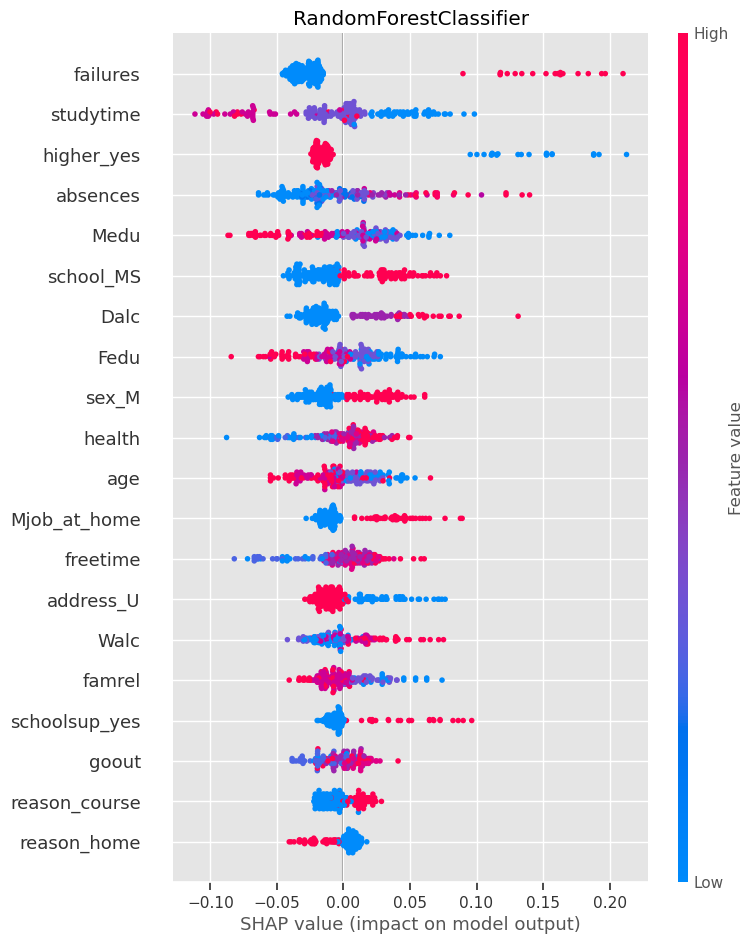

In [99]:
## option B: saving class as separate var first
shap_vals_1 = shap_values[:,:,1]
fig, ax = plt.subplots()
shap.summary_plot(shap_vals_1,features= X_shap,show=False)
ax.set_title('RandomForestClassifier');

## LogisticRegression
Now, we will instantiate an explainer for our Logistic Regression Model. Can you notice the difference when instantiating?

In [100]:
## logreg
explainer_logreg = shap.Explainer(logreg,X_shap)
explainer_logreg

### For Logistic Regression:

We MUST provide the X data in addition to our model when instantiating our explainer. (If not, you will receive a cryptic error message!)
We created an explainer.Linear
Now we will examine the shape of our output for a Logistic Regression model:

In [102]:
## Getting the shap values
shap_values_logreg = explainer_logreg(X_shap)
print(type(shap_values_logreg))
shap_values_logreg.shape

<class 'shap._explanation.Explanation'>


(200, 43)

### For Logistic Regression:

We only get a 2-dimensional output (Remember with Random Forest, the output was 3d).
We only get 1 set of values for the 1 class.
Therefore do NOT need to slice out anything from our shap_values before visualizing them.
The code below will produce a summary plot for our logistic regression model:

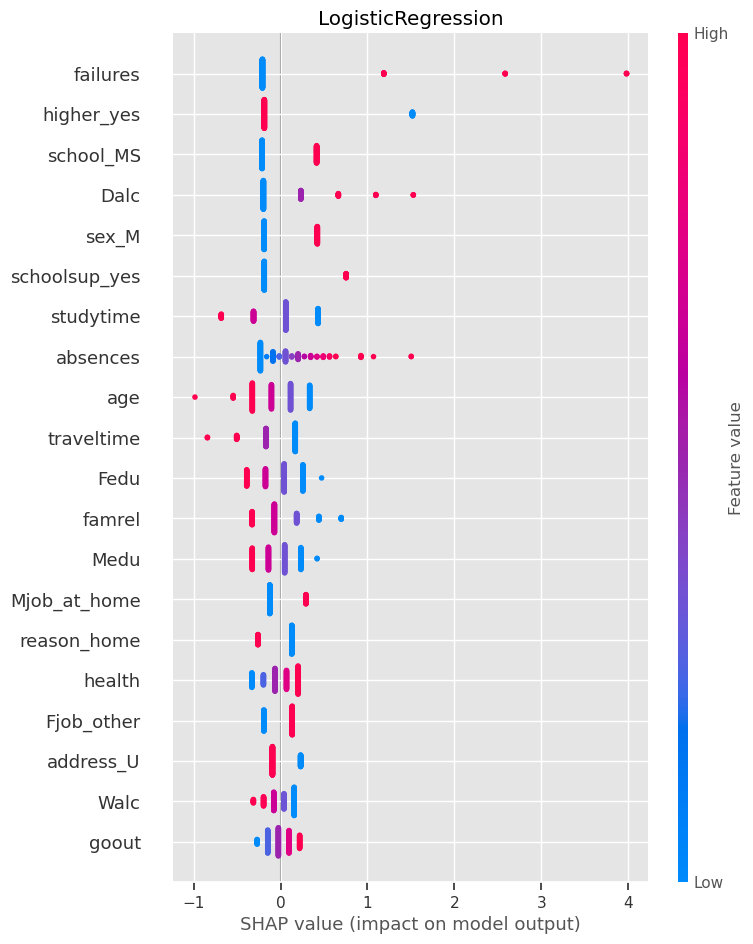

In [103]:
## logreg
fig, ax = plt.subplots()
shap.summary_plot(shap_values_logreg,features= X_shap, show=False)
ax.set_title('LogisticRegression');

Notice that the summary plot looks very different and isn't as interesting and informative as our random forest's summary plot.

## KNN
Finally, we will instantiate an explainer for our KNN model. Can you notice another difference when instantiating the model?

In [104]:
explainer_knn = shap.Explainer(knn.predict, X_shap)
explainer_knn

### For KNN:

We MUST provide the X data as well (as we did with Logistic Regression).
We also must pass our KNN's .predict method as the first argument, instead of the model itself (or we will receive a cryptic error message!)
Note: Due to the fact that KNN models do all of their learning during when using .predict, calculating the SHAP values takes much longer.
We created an explainer.Permutation.
We will examine the shape of the output as we did with our other models:

In [105]:
shap_vals_knn = explainer_knn(X_shap)
print(type(shap_vals_knn))
shap_vals_knn.shape

Permutation explainer: 201it [00:43,  3.68it/s]                                 

<class 'shap._explanation.Explanation'>


(200, 43)

### For KNN:

We only get a 2 dimensional output (Remember with Random Forest, the output was 3d).
We only get 1 set of values for the 1 class.
Therefore do NOT need to slice out anything from our shap_values before visualizing them.
The code below will produce a summary plot for our KNN model:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


Text(0.5, 1.0, 'KNN')

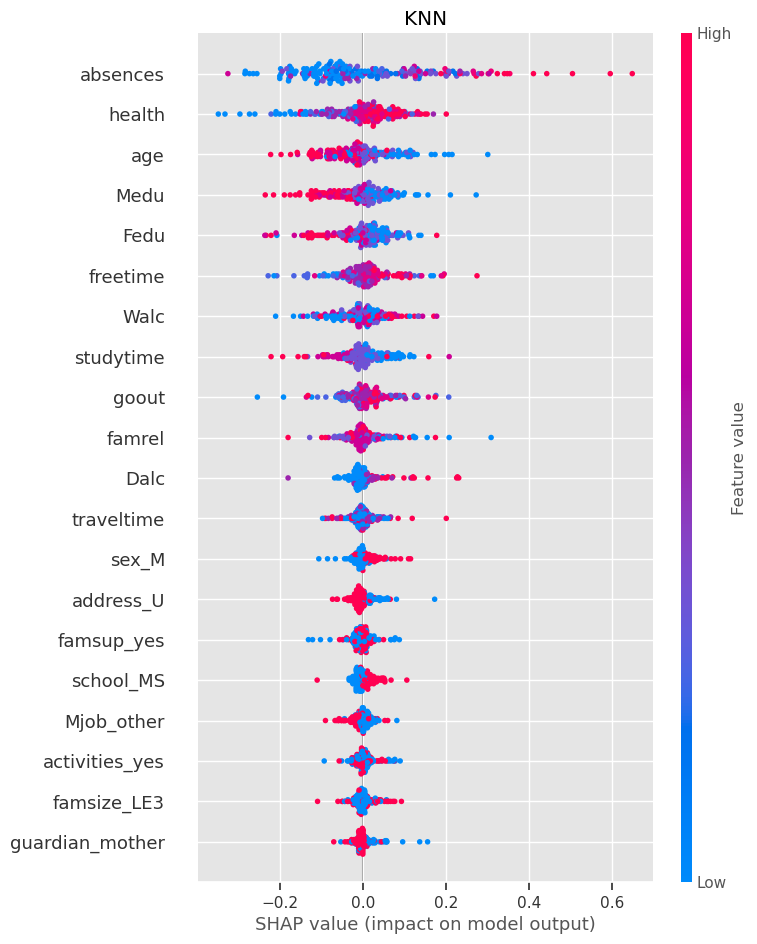

In [106]:
fig, ax = plt.subplots()
shap.summary_plot(shap_vals_knn,features= X_shap, show=False)
ax.set_title('KNN')

Notice that the KNN summary plot looks more like our original RandomForest than the logistic regression.
### Summary
Depending on which model you are using, your code to apply SHAP will change. The two main changes are in the arguments that must be included when instantiating the explainer and the shape of the output. The table below highlights these differences:
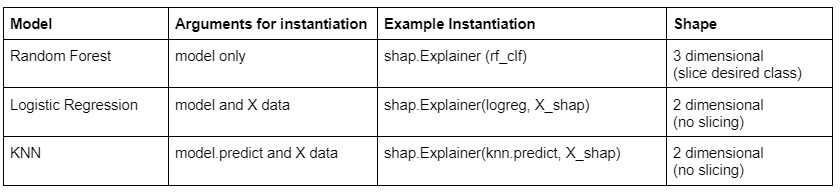

# SHAP Local Explanations


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       205
        True       1.00      1.00      1.00       281

    accuracy                           1.00       486
   macro avg       1.00      1.00      1.00       486
weighted avg       1.00      1.00      1.00       486



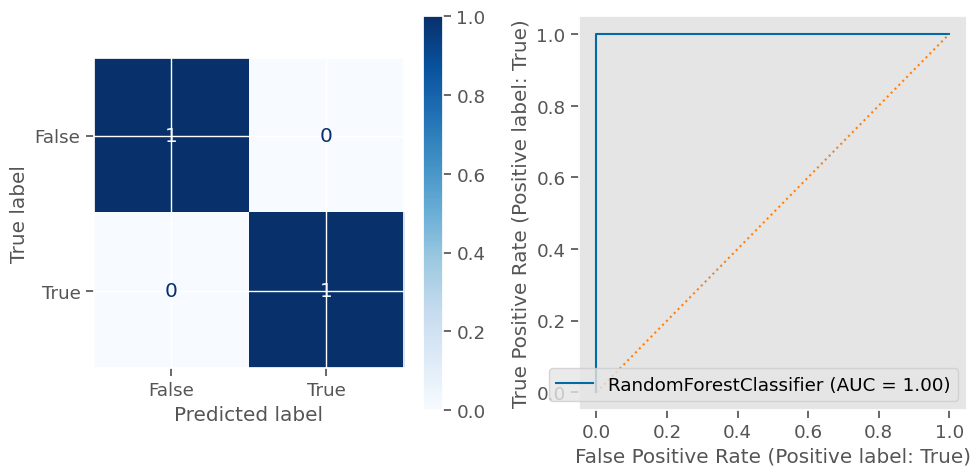

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

       False       0.75      0.68      0.71        71
        True       0.77      0.83      0.80        92

    accuracy                           0.76       163
   macro avg       0.76      0.75      0.75       163
weighted avg       0.76      0.76      0.76       163



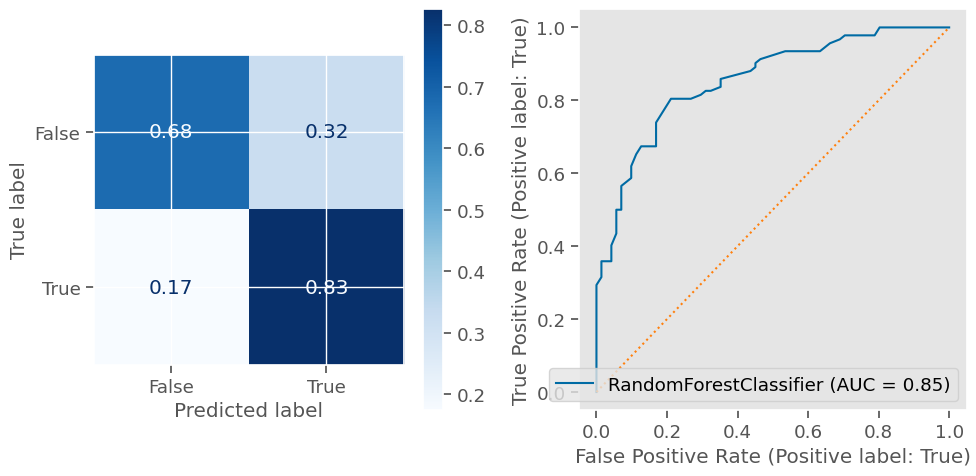

In [107]:
## fit random forest
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train_df,y_train)
evaluate_classification(rf_clf,X_train_df,y_train, X_test_df,y_test)

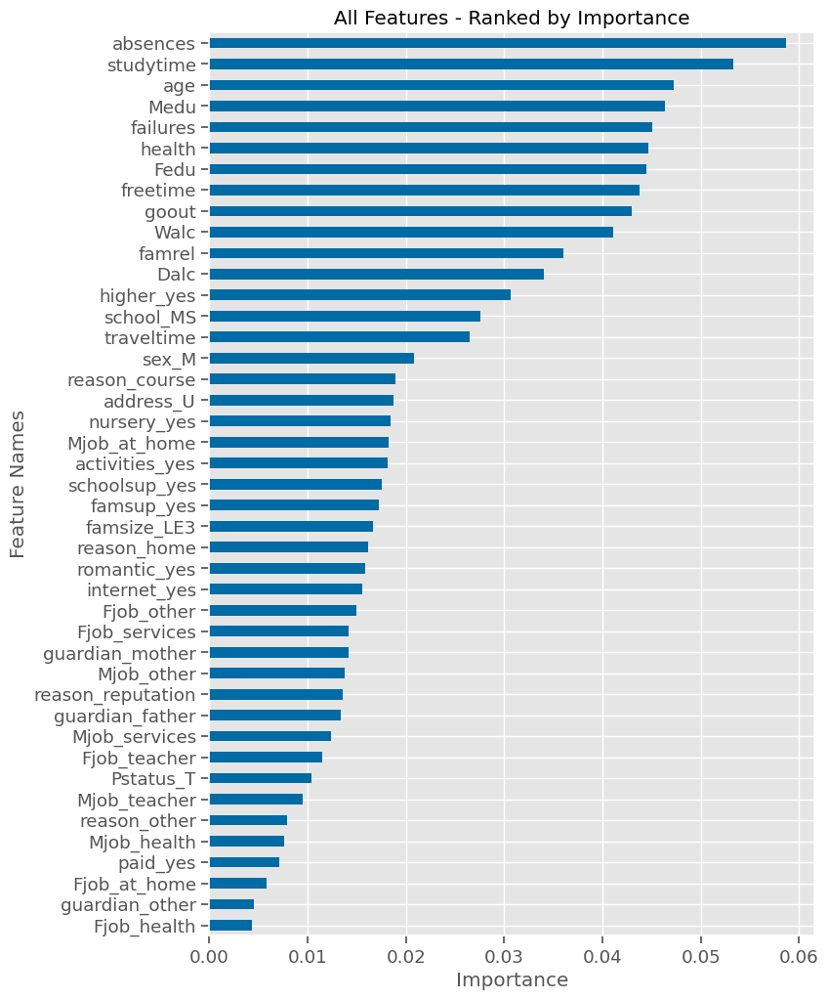

In [108]:
rf_importances = get_importances(rf_clf)
ax = plot_importance(rf_importances, figsize=(8,12))

In [109]:
# Import shap and initialize javascript:
import shap
shap.initjs()

In [110]:
len(X_train_df)

486

Here is where we could reduce our sample size, but 486 is relatively small, so we will keep the entire data set. In fact, we will include ALL of our data here by recombining our train and test sets.

In [111]:
## Using the entire dataset (still relatively small)
X_shap = pd.concat([X_train_df, X_test_df])

In [112]:
y_shap = pd.concat([y_train,y_test])
y_shap

54     False
208     True
23      True
547     True
604     True
       ...  
333    False
454     True
56     False
203     True
182    False
Name: target_F, Length: 649, dtype: bool

In order to slice out the correct shap values later on, we are going to sort the X and y data by their index. This way, the same integer index would work for X_shap, y_shap, and shap_values.

In [113]:
X_shap = X_shap.sort_index()
y_shap = y_shap.sort_index()
display(X_shap.head(),y_shap.head())

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
0,18.0,4.0,4.0,2.0,2.0,0.0,4.0,3.0,4.0,1.0,1.0,3.0,4.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,17.0,1.0,1.0,1.0,2.0,0.0,5.0,3.0,3.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
2,15.0,1.0,1.0,1.0,2.0,0.0,4.0,3.0,2.0,2.0,3.0,3.0,6.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
3,15.0,4.0,2.0,1.0,3.0,0.0,3.0,2.0,2.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
4,16.0,3.0,3.0,1.0,2.0,0.0,4.0,3.0,2.0,1.0,2.0,5.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0


0     True
1     True
2     True
3    False
4    False
Name: target_F, dtype: bool

In [114]:
explainer = shap.Explainer(rf_clf)
explainer

In [115]:
## Getting the shap values
shap_values = explainer(X_shap,y_shap)

In [116]:
shap_vals_1 = shap_values[:,:,1]
shap_vals_1.shape

(649, 43)

### Note about Creating X_shap & y_shap with large datasets
In the current example, we have a very small number of rows and can afford to use the entire dataset. This will not be case in most situations.

Remember that with larger datasets, we would want to use shap.sample to take a subset of our X data. Since we used the original index when creating our X_train_df and y_train, we can create y_shap by slicing out the index of X_shap with .loc

In [117]:
X_shap = shap.sample(X_train_df, nsamples=400,random_state=321)
y_shap = y_train.loc[X_shap.index]

In order to make sure our integer indices for our calculate shap_values will match the index of our X_shap and y_shap variables, we will use .reset_index(drop=True) instead of .sort_index(). This way the indices for X_shap and y_shap are the same as their position.

In [118]:
X_shap_local = X_shap.reset_index(drop=True)
y_shap_local = y_shap.reset_index(drop=True)

Note: while the result will look the same, the indices of our X_shap and y_shap variables no longer match the indices from the original dataset, so we will not be able to identify the original row if we wanted to.

In [119]:
## Getting the shap values wth the local X_shap 
shap_values = explainer(X_shap_local,y_shap_local)
shap_vals_1 = shap_values[:,:,1]

## Getting Final Predictions
We will want to know what our model would predict for any of our examples. To this end, we will want to get the predictions from our model for our X_shap.
Additionally, it may be helpful to extract the predicted probabilities as well, instead of just the final class.

In [120]:
y_pred = rf_clf.predict(X_shap_local)
y_pred = pd.Series(y_pred, index=X_shap_local.index, name='Predicted')
y_pred

0       True
1      False
2       True
3      False
4       True
       ...  
395     True
396    False
397     True
398     True
399     True
Name: Predicted, Length: 400, dtype: bool

In [121]:
y_proba = rf_clf.predict_proba(X_shap_local)
y_proba

array([[0.05, 0.95],
       [0.76, 0.24],
       [0.06, 0.94],
       [0.83, 0.17],
       [0.19, 0.81],
       [0.08, 0.92],
       [0.06, 0.94],
       [0.1 , 0.9 ],
       [0.93, 0.07],
       [0.85, 0.15],
       [0.12, 0.88],
       [0.82, 0.18],
       [0.84, 0.16],
       [0.13, 0.87],
       [0.84, 0.16],
       [0.22, 0.78],
       [0.05, 0.95],
       [0.01, 0.99],
       [0.2 , 0.8 ],
       [0.11, 0.89],
       [0.87, 0.13],
       [0.07, 0.93],
       [0.88, 0.12],
       [0.83, 0.17],
       [0.8 , 0.2 ],
       [0.16, 0.84],
       [0.03, 0.97],
       [0.09, 0.91],
       [0.15, 0.85],
       [0.73, 0.27],
       [0.87, 0.13],
       [0.78, 0.22],
       [0.25, 0.75],
       [0.1 , 0.9 ],
       [0.07, 0.93],
       [0.84, 0.16],
       [0.89, 0.11],
       [0.05, 0.95],
       [0.07, 0.93],
       [0.11, 0.89],
       [0.02, 0.98],
       [0.27, 0.73],
       [0.3 , 0.7 ],
       [0.81, 0.19],
       [0.75, 0.25],
       [0.13, 0.87],
       [0.77, 0.23],
       [0.1 ,

In [122]:
y_proba.shape

(400, 2)

We will save just the second column of probabilities, for the class we are explaining (Fail==True).

In [123]:
y_proba = pd.Series(y_proba[:,1], index=X_shap_local.index, name='Predicted Prob')
y_proba

0      0.95
1      0.24
2      0.94
3      0.17
4      0.81
       ... 
395    0.88
396    0.19
397    0.91
398    0.94
399    0.96
Name: Predicted Prob, Length: 400, dtype: float64

### Selecting Examples - Based on Important Features
To give our stakeholder more of a story associated with the findings, it can be useful to select some representative examples from our data set. The exact samples chosen will vary, but you should be purposeful about which samples you select to highlight.

First, we will revisit our summary plot to help us select features of interest:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


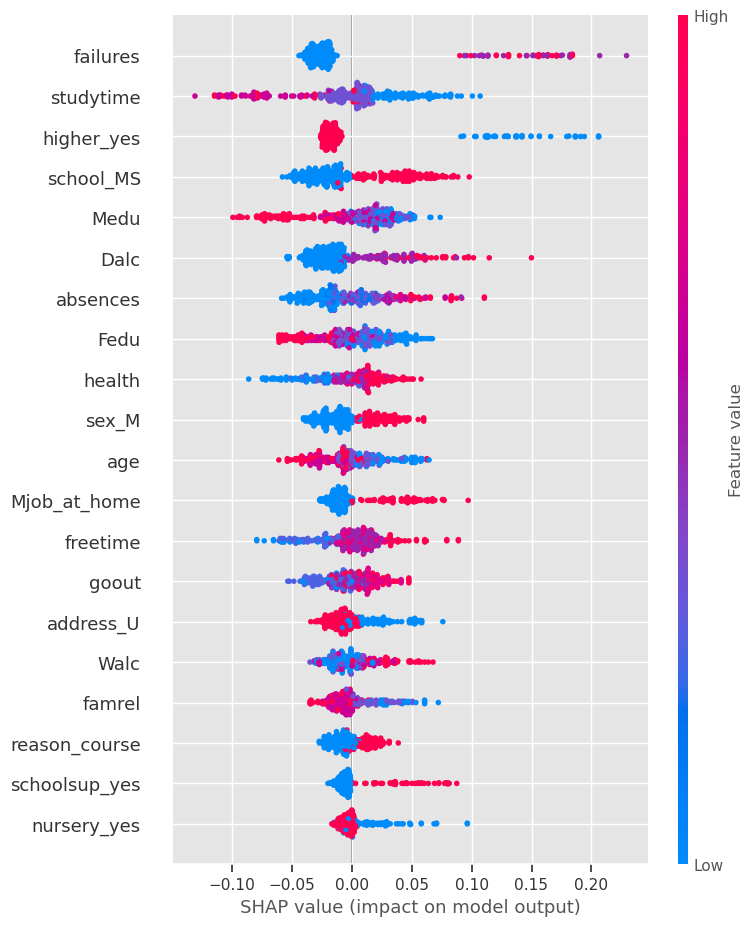

In [124]:
shap.summary_plot(shap_vals_1,X_shap_local)

We noticed several important/impactful features over the last several lessons.
It would be very helpful to find some observations that will demonstrate some of our interesting findings.
Some interesting features/examples to explore:
Students with mean/median study time
Students with mean/median Dalc
### Students with Mean/Median Study Time

<AxesSubplot: xlabel='studytime', ylabel='Count'>

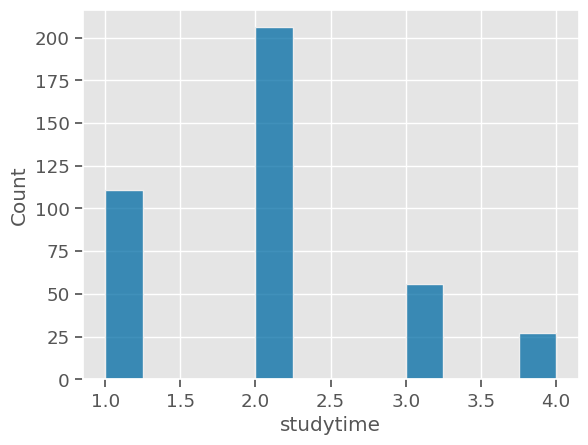

In [125]:
sns.histplot(X_shap_local['studytime'])

According to the data dictionary, "studytime":
weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)

In [126]:
X_shap_local['studytime'].agg(['mean','median'])

mean      1.9975
median    2.0000
Name: studytime, dtype: float64

In [127]:
## Finding number of students with studytime==2.
filt_med_study = X_shap_local['studytime'] == 2.0
len(X_shap_local[filt_med_study])

206

As we can see, many students fall into this category (305).
Let's further filter out for important features. Higher_yes may be a good feature to use.
### Students Intent to Pursue Higher Education
We will be filtering out students who intend to pursue higher education, but who only put in the average amount of study time.

In [128]:
filt_higher_yes = X_shap_local['higher_yes']==True
len(X_shap_local[ filt_med_study & filt_higher_yes])

193

Removing students who do not plan to attend higher education, brings our number of students down to 286.

### Students - Weekday Alcohol Consumption
Let's also filter based on Dalc, weekday alcohol consumption.

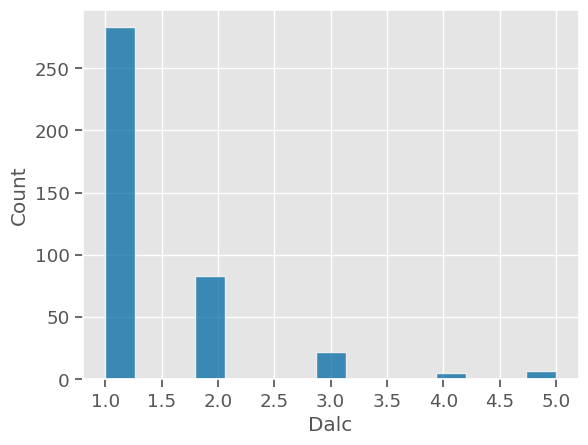

In [129]:
sns.histplot(X_shap_local['Dalc']);

According to the data dictionary:
Dalc: workday alcohol consumption (numeric: from 1 - very low to 5 - very high)
### Let's create 2 separate groups with our filters.
Students with low Dalc (weekday alcohol consumption)
Students with high Dalc (weekday alcohol consumption)

In [130]:
filt_low_drinkers = X_shap_local['Dalc']==1
filt_low_drinkers

0      False
1       True
2       True
3       True
4       True
       ...  
395     True
396     True
397     True
398     True
399     True
Name: Dalc, Length: 400, dtype: bool

In [131]:
len(X_shap_local[ filt_med_study & filt_higher_yes & filt_low_drinkers])

143

We have 143 students who had average study time, want to attend higher education, and who are LOW drinkers.

In [132]:
filt_hi_drinkers = X_shap_local['Dalc']>3
len(X_shap_local[ filt_med_study & filt_higher_yes & filt_hi_drinkers])

4

We have 4 students who had average time, want to attend higher education, and who are HIGH drinkers.

## Defining Our Example Groups
To make it easier to work with our complex slicing. Let's define group names for each set of criteria.

Both Groups:
Have average study time
Intend to continue higher education
Group High:
High Weekday Drinkers
Group Low:
Low Weekday Drinkers
### Filtering Based on Final Class
For both Group High and Group Low, let's consider an example of a student who Failed and one who Passed.

In [133]:
filt_fail = y_shap_local==True
filt_pass = y_shap_local==False

In [134]:
## Get filter for all group High that passed
filt_grp_high_pass = filt_med_study & filt_higher_yes &filt_hi_drinkers & filt_pass
filt_grp_high_pass.sum()

1

In [135]:
## Get filter for all group High that failed
filt_grp_high_fail = filt_med_study & filt_higher_yes &filt_hi_drinkers & filt_fail
filt_grp_high_fail.sum()

3

As we can see above, in Group High (high drinkers) we have:
1 student that passed
3 students that failed.

In [136]:
## Get filter for all group Low that passed
filt_grp_low_pass = filt_med_study & filt_higher_yes &filt_low_drinkers & filt_pass
filt_grp_low_pass.sum()

71

In [137]:
## Get filter for all group Low that failed
filt_grp_low_fail = filt_med_study & filt_higher_yes &filt_low_drinkers & filt_fail
filt_grp_low_fail.sum()

72

As we can see above, in Group Low (low drinkers) we have:
71 student that passed
72 students that failed.
### Select one example of each for further exploration
We will now select an individual sample to explore with each of these conditions:

High drinker who passed
High drinker who failed
Low drinker who passed
Low drinker who failed
Also recall that all four of our samples had average study time and want to attend higher education.

### Group High: Passed
Obtain the index value of high drinkers who passed:

In [138]:
## Selecting indices of Group High students who passed
idx_examples_grp_high_Pass = X_shap_local[filt_grp_high_pass].index
idx_examples_grp_high_Pass

Int64Index([287], dtype='int64')

Recall that we only had one student in the high drinking group who passed. They were the student at index position 287.

If you had more students, you could randomly select one with np.random.choice().

In [139]:
## selecting index of final example
i_grp_high_pass = 287  
# or use np.random.choice(idx_examples_grp_high_Pass)
example_grp_high_pass = X_shap_local.loc[i_grp_high_pass]
example_grp_high_pass

age                  17.0
Medu                  2.0
Fedu                  2.0
traveltime            1.0
studytime             2.0
failures              0.0
famrel                4.0
freetime              4.0
goout                 2.0
Dalc                  5.0
Walc                  5.0
health                4.0
absences              0.0
school_MS             0.0
sex_M                 1.0
address_U             1.0
famsize_LE3           1.0
Pstatus_T             1.0
Mjob_at_home          0.0
Mjob_health           0.0
Mjob_other            1.0
Mjob_services         0.0
Mjob_teacher          0.0
Fjob_at_home          0.0
Fjob_health           0.0
Fjob_other            1.0
Fjob_services         0.0
Fjob_teacher          0.0
reason_course         0.0
reason_home           1.0
reason_other          0.0
reason_reputation     0.0
guardian_father       1.0
guardian_mother       0.0
guardian_other        0.0
schoolsup_yes         0.0
famsup_yes            0.0
paid_yes              0.0
activities_y

### Group High: Failed
Obtain the index values for high drinkers who failed:

In [140]:
## Selecting indices of Group A students who failed
idx_examples_grp_high_Fail = X_shap_local[filt_grp_high_fail].index
idx_examples_grp_high_Fail

Int64Index([57, 100, 118], dtype='int64')

Recall that we had 3 students in the high-drinking group who failed.  Once again, if we had a larger number of observations to sift through, we could use the random method to select one of these 3 for further exploration. Since we only have 3, we will manually select an index.

In [141]:
## Select a random index from the list.
i_grp_high_fail = np.random.choice(idx_examples_grp_high_Fail)
i_grp_high_fail = 57
example_grp_high_fail = X_shap_local.loc[i_grp_high_fail]
example_grp_high_fail.head()

age           18.0
Medu           2.0
Fedu           2.0
traveltime     2.0
studytime      2.0
Name: 57, dtype: float64

### Group Low: Passed
We will repeat the process to select a student from the low-drinking group who passed:

In [142]:
## Selecting indices of Group A students who passed
idx_examples_grp_low_Pass = X_shap_local[filt_grp_low_pass].index
## selecting index of final example
i_grp_low_pass = np.random.choice(idx_examples_grp_low_Pass)
example_grp_low_pass = X_shap_local.loc[i_grp_low_pass]
example_grp_low_pass.head()

age           18.0
Medu           3.0
Fedu           2.0
traveltime     1.0
studytime      2.0
Name: 59, dtype: float64

Note: since np.random.choice is a random selection, your example may not match the one seen in this lesson. That's ok! Just follow along with the logic, as applied to the example selected here.
### Group Low: Failed
And finally, we will repeat the process to identify a low drinker who failed:

In [143]:
## Selecting indices of Group A students who failed
idx_examples_grp_low_Fail = X_shap_local[filt_grp_low_fail].index
## Select an example index from the list.
i_grp_low_fail = 331
example_grp_low_fail = X_shap_local.loc[i_grp_low_fail]
example_grp_low_fail.head()

age           16.0
Medu           2.0
Fedu           1.0
traveltime     2.0
studytime      2.0
Name: 331, dtype: float64

## Visualizing Individual Shap for Selected Examples
Now we have four individual samples to explore

High drinker who passed
High drinker who failed
Low drinker who passed
Low drinker who failed
Since we sorted the index of our X_shap before calculating shap values, we can use the index name that we'd use with .loc to slice out from the X_shap with .iloc and to slice from our shap_values using the same index.

### Group High (High Drinkers)
### Group High: Passed
Now we will look at the true and predicted class for our example:

In [144]:
print(f"Example of a High Drinker that Passed:")
print(f"True Class: Fail = {y_shap_local.loc[i_grp_high_pass]}")
print(f"Predicted Class: Fail = {y_pred.loc[i_grp_high_pass]}")

Example of a High Drinker that Passed:
True Class: Fail = False
Predicted Class: Fail = False


The model got this one correct. Both the true outcome and the prediction were Passing (Fail == False).

### Force Plot
Recall that we first introduced individual force plots when learning how to read global force plots.

Now we will examine the force plot for this student:

In [145]:
## Individual forceplot of example high drinker 
shap.force_plot(explainer.expected_value[1],
                shap_values=shap_vals_1[i_grp_high_pass].values,
               features=X_shap_local.iloc[i_grp_high_pass])

As we can see in the force plot above for the example student that is a high drinker who passed:
We can see that while having high weekend alcohol consumption(Walc), and being Male were both pushing the prediction towards failing, many features were pushing the prediction in the passing direction: he had 0 absences, 0 failures, goes out with friends only 2 out of 5 ordinal scale, and the reason the student is attending the school is it is close to home.
### Group High: Failed
Let's see how our model performed for our example of a high drinker who failed:

In [146]:
print(f"Example of High Drinker that Failed:")
print(f"True Class: Fail = {y_shap_local.loc[i_grp_high_fail]}")
print(f"Predicted Class: Fail = {y_pred.loc[i_grp_high_fail]}")

Example of High Drinker that Failed:
True Class: Fail = True
Predicted Class: Fail = True


The model got this prediction correct also.

Let's take a look at the force plot:

In [147]:
## Individual forceplot of example low drinker
shap.force_plot(explainer.expected_value[1],shap_values=shap_vals_1[i_grp_high_fail].values,
               features=X_shap_local.iloc[i_grp_high_fail])

As we can see in the force plot above for the example student that is a high drinker who failed:
In addition to high weekday alcohol consumption (5 out of 5), a whopping 9 absences, and being male, the student ALSO had high weekend alcohol consumption (5 out of 5). 
A few small "pushes" towards predicting passing included the student had such a small effect that we do not even see their feature names.
### Comparing High Drinkers: Pass vs Fail
We can see that both students had high weekday alcohol consumption and were male. However, the major differences were that the student who failed had a high number of absences AND high weekend alcohol consumption.
### Group Low (Low Drinkers)
Now let's explore our low drinkers:
### Group Low: Passed

In [148]:
print(f"Example of a Low Drinker that Passed:")
print(f"True Class: Fail = {y_shap_local.loc[i_grp_low_pass]}")
print(f"Predicted Class: Fail = {y_pred.loc[i_grp_low_pass]}")

Example of a Low Drinker that Passed:
True Class: Fail = False
Predicted Class: Fail = False


The prediction was correct for this low drinker who passed.

Examine the force plot:

In [149]:
## Individual forceplot of example high drinker 
shap.force_plot(explainer.expected_value[1],shap_values=shap_vals_1[i_grp_low_pass].values,
               features=X_shap_local.iloc[i_grp_low_pass])

As we can see in the force plot above for the example student that is a low drinker who passed:
while there were some features that were pushing the prediction towards failing, their effect was very small.
Many more features were pushing in the opposite direction towards passing:
Attends GP
age is 17
No failures
Goes out only sometimes (only 2 out of 5)
plans to pursue higher education.
### Group Low: Failed

In [150]:
print(f"Example of a Low Drinker that Failed:")
print(f"True Class: Fail = {y_shap_local.loc[i_grp_low_fail]}")
print(f"Predicted Class: Fail = {y_pred.loc[i_grp_low_fail]}")

Example of a Low Drinker that Failed:
True Class: Fail = True
Predicted Class: Fail = True


This prediction was also correct.

Now let's see what contributed to this prediction by examining our force plot:

In [151]:
## Individual forceplot of example low drinker 
shap.force_plot(explainer.expected_value[1],shap_values=shap_vals_1[i_grp_low_fail].values,
               features=X_shap_local.iloc[i_grp_low_fail])

As we can see in the force plot above for the example student that is a low drinker who failed:
there were many features pushing the prediction towards failing:
low study time (2 out of 5)
Father's education level is low (1 out of 5)
being male
Mother's education level is low (2 out of 5)
Attends MS
and more.

There were a few features pushing in the opposite direction, toward passing:
0 failures
0 absences

### Summary
This lesson is just an example of the process to get you started on your dig into the data to find the story you want to share with your stakeholders. Note that we have only examined one example of each case. Also, we could certainly filter for more features to keep additional features more consistent. For example, we might want to look separately at males and females or separately at students at each of the schools. Alternatively, you might want to look at the cases where your model predictions were wrong to understand why it made the prediction it did. There are many ways to filter and choose examples. Now that you see the process keep on exploring!

# (Optional) More Local SHAP Plots


Additional Shap Visualizations for Local Explainers
As an alternative to force plots, you may also want to try producing alternative plots like the ones featured below.
Additional Plots - Waterfall
The waterfall plot will show the top features that influenced the prediction for this observtion.
It is showing the same information as our individual force plot, though in a simpler form.
The effect of each feature is on a separate line with the final shap value annotated above the plot.
Each feature is shown as an arrow pointing left or right.
The end of each arrow shows the cumulative shap value from summing the features below it.
Only the top features are shown individually with the remaining features are lumped together in 1 final arrow at the bottom of the plot.

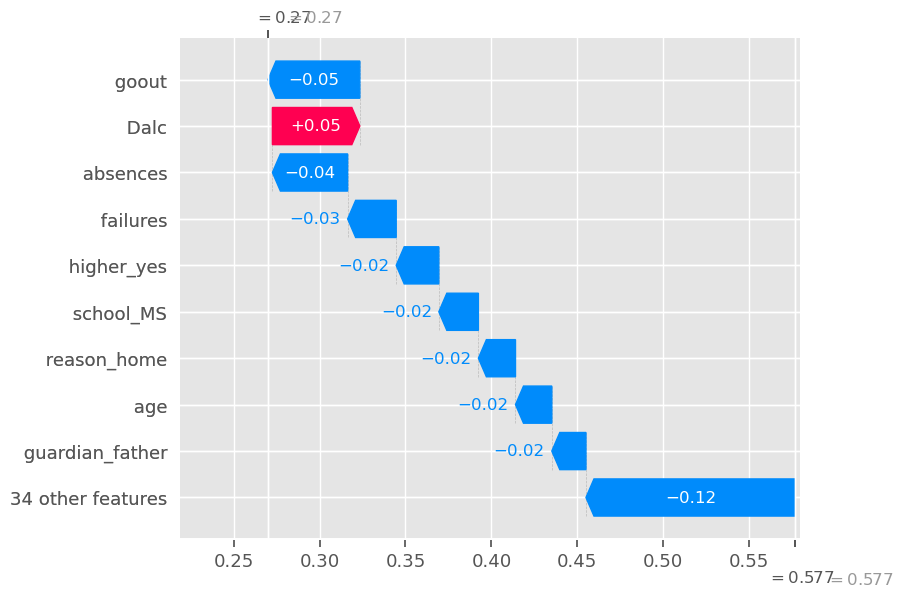

In [154]:
#source: https://towardsdatascience.com/explainable-ai-xai-a-guide-to-7-packages-in-python-to-explain-your-models-932967f0634b
shap.plots._waterfall.waterfall_legacy(explainer.expected_value[1],
                                       shap_values=shap_vals_1[i_grp_high_pass].values,
                                      features=X_shap_local.loc[i_grp_high_pass],
                                       show=True)

### Additional Plots - Decision Plot
Another visualization to consider is a Decision Plot, which is very similar to a Waterfall plot, but instead of using the ends of block arrows to show the effect of each feature, the cumulative shap value (from bottom to top) are shown as a continuous line.
The values for each feature are shown in parentheses.
Unlike the waterfall chart, each features effect is not shown in color. Color reflects the overall shap value.
Instead, the effect of each feature can be seen in the movement of the line towards the left/right vs the previous feature.

In [155]:
filt_grp_high_all = filt_med_study & filt_higher_yes &filt_hi_drinkers
X_shap_local.loc[filt_grp_high_all]

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
57,18.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,5.0,5.0,4.0,9.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0
100,17.0,4.0,3.0,2.0,2.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0
118,16.0,1.0,1.0,2.0,2.0,0.0,5.0,4.0,5.0,4.0,5.0,3.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0
287,17.0,2.0,2.0,1.0,2.0,0.0,4.0,4.0,2.0,5.0,5.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0


In [156]:
idx_examples_grp_high_Fail



Int64Index([57, 100, 118], dtype='int64')

In [157]:
X_shap_sm = X_shap_local.loc[filt_grp_high_all]
y_shap_sm = y_shap_local.loc[filt_grp_high_all]

In [158]:
## getting ALL group A row #'s'
idx_grp_high= list(filt_grp_high_all[filt_grp_high_all].index)
idx_grp_high

[57, 100, 118, 287]

In [159]:
shap_vals_1_sm = shap_vals_1[idx_grp_high]
shap_vals_1_sm.shape

(4, 43)

In [160]:
idx_examples_grp_high_Pass

Int64Index([287], dtype='int64')

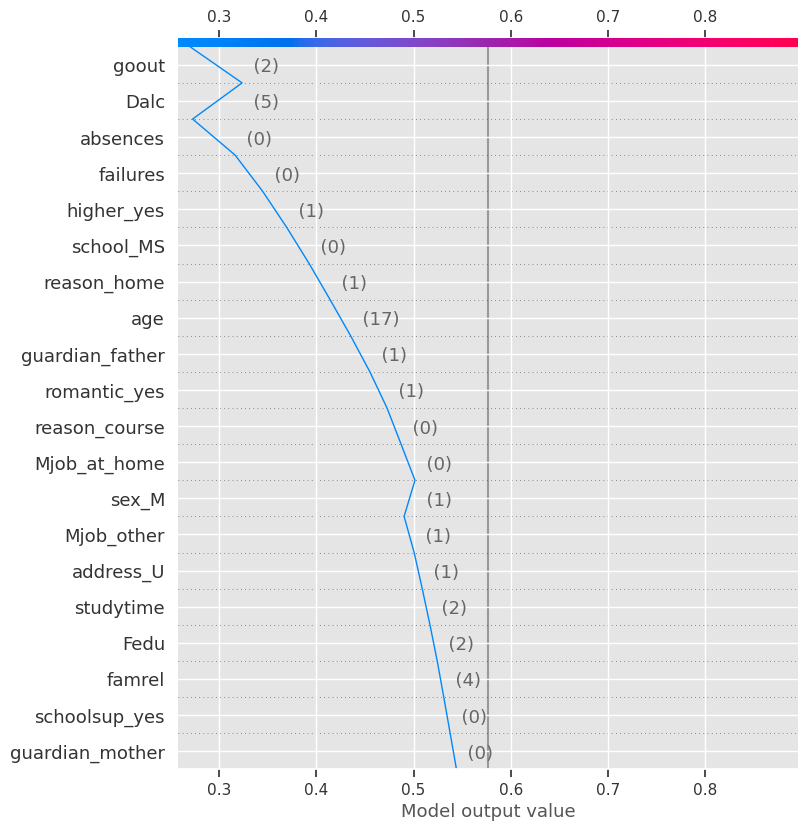

In [161]:
shap.decision_plot(explainer.expected_value[1],
                                       shap_values=shap_vals_1[i_grp_high_pass].values,
                                       features=X_shap_local.loc[i_grp_high_pass])

### Summary
In this lesson, we gave a brief introduction to additional plot types included in the shap package. While we will not be using these in your assignments, they are additional options for displaying shap results to stakeholders.

# LIME: Local Explanations
LIME (Local Interpretable Model-agnostic Explanations) is another model explanation package. Unlike SHAP, lime is dedicated to local explanations, meaning explaining a single observation.

It has explainers for tabular data, image classification, and text classification.

How LIME Works
LIME will explain complex models by calculating small linear models that are built around a specific explanation.
In their example diagram below:
the Pink/Blue shading represents the complex algorithm determined by the machine learning model.
The large red plus represents the example it is trying to explain.
The dashed line represents a simple linear equation that can be used to explain why the example was classified as red vs blue.
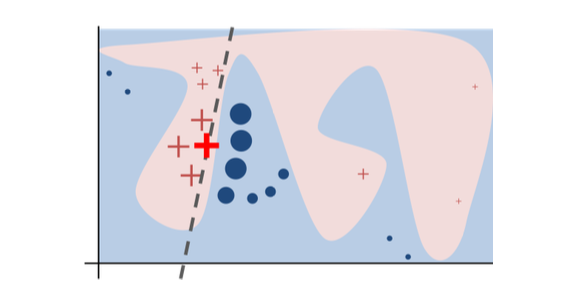

### Using the LimeTabularExplainer
For our type of data, we will be using the LimeTabularExplainer class.
Very similarly to s, we must first create an instance of an Explainer class.
Unlike SHAP, the LimeTablulaerExplainer does not require the model itself but does require the following:
training_data: the training data as an array (we will use our X_shap dataframe and take the .values to get the array).
feature_names: the feature names, which we can take from the columns of our X_shap variable.
class_names: the names of our classes (Pass/Fail).
mode: which type of model is being explained classification or regression? The default is "classification."

In [162]:
from lime.lime_tabular import LimeTabularExplainer
lime_explainer =LimeTabularExplainer(
    training_data=X_shap_local.values,  
    feature_names=X_shap_local.columns,
    class_names=['Pass', 'Fail'], 
   mode='classification'
)
lime_explainer

Then, we will use the explainer's explain_instance method to produce an explanation.
The explain_instance method requires the following arguments:
data_row: The values for a single observation.
predict_fn: The predict_proba method from our model.
We can then use the explanation's show_in_notebook method to display the result.
### Group high - Failed

In [164]:
example_grp_high_fail.head()

age           18.0
Medu           2.0
Fedu           2.0
traveltime     2.0
studytime      2.0
Name: 57, dtype: float64

In [165]:
exp = lime_explainer.explain_instance(example_grp_high_fail, rf_clf.predict_proba)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Note that the displayed result is actually HTML and not an image.
The explanation can also export a list of the values used above using .as_list(), as well as the bar graph using .as_pyplot_figure().
However, neither of these will look nearly as good as the HTML version above.

In [166]:
## getting the explanation values as a list
exp_df = pd.DataFrame(exp.as_list(),columns=['Effect','Value'])
exp_df

,Effect,Value
0,failures > 0.00,0.163219
1,Dalc > 2.00,0.071526
2,absences > 6.00,0.063637
3,Fjob_teacher <= 0.00,0.061336
4,school_MS <= 0.00,-0.054808
5,Mjob_at_home <= 0.00,-0.046426
6,Medu <= 2.00,0.039598
7,schoolsup_yes <= 0.00,-0.038213
8,0.00 < sex_M <= 1.00,0.035934
9,freetime <= 3.00,-0.028603


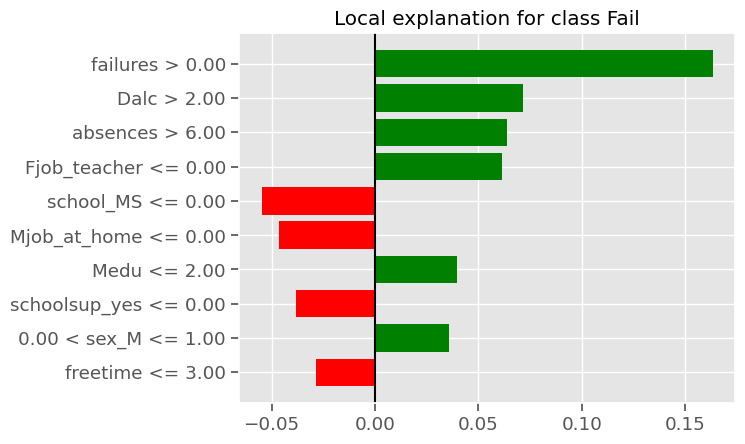

In [167]:
## getting the explanation barplot as a matplotlib figure
fig =exp.as_pyplot_figure();
axes = fig.get_axes()
axes[0].axvline(0,color='k');

## Interpreting a Lime Tabular Explanation
Let's give an example a lime explanation and discuss its three components.
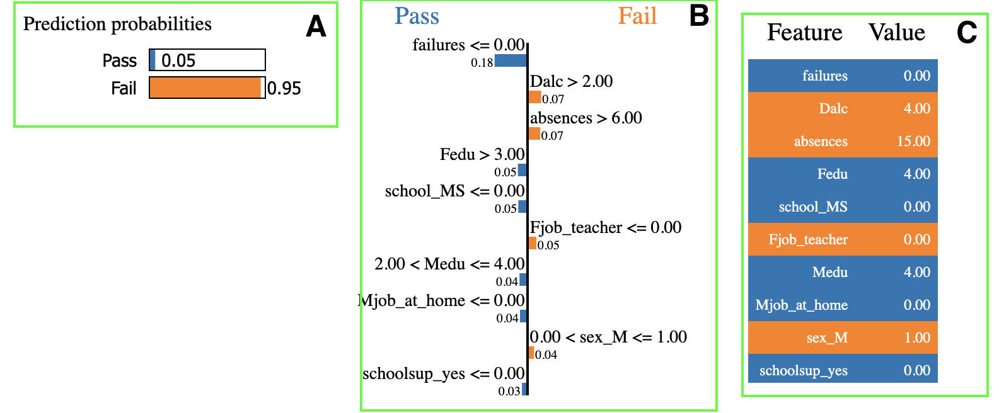

- A (left):
Probability values for each class from the model's predict_proba.
- B (middle):
Bar graph of the contributions for each feature towards the final probability, with the most impactful feature at the top.
Each feature is labeled with the probability values used to separate the feature into sub-groups.
Features shown in blue are those that negatively influenced predicting the 1 class. These values should will all be to the left of the center line.
Features shown in orange are those that positively influenced predicting the 1 class. These values should all be to the right of the center line.
- C (right):
The actual original values for each feature for this particular observation.
### Group high: Failed

In [169]:
exp = lime_explainer.explain_instance(example_grp_high_fail, rf_clf.predict_proba)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


As we can see above, this student from our high-drinkers group had a very high probability of failing.
While the student several features that were associated with Passing:
Mjob_at_home=0
school_MS =0
Address_U =1
Three the top 5 most impactful features were associated with Failing:
more than 0 failures (they had 3)
more than 6 absences (actually had 9 absences),
and the fact that they have high weekday alcohol consumption.
### Group High: Passed

In [170]:
exp = lime_explainer.explain_instance(example_grp_high_pass, rf_clf.predict_proba)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


As we can see above, this student from our high-drinkers group had a high probability of passing.
While the student several features that were associated with Failing:
Dalc >2 (was 5)
Medu <=2
0<sex_M<=1 (meaning they were male).
4 out of out of the top 5 features were associated with passing:
failures<=0
absences<=0
school_MS<=0 (meaning school=GP)
Mjob_at_home <=0
### Your Turn
Now that we've walked through the first 2 examples together, take a few minutes to interpret the final 2 examples on your own.

### Group Low: Failed

In [171]:
exp = lime_explainer.explain_instance(example_grp_low_fail, rf_clf.predict_proba)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


- Which features were associated with Failing?
- Which features were associated with Passing?
### Group Low: Passed

In [172]:
exp = lime_explainer.explain_instance(example_grp_low_pass, rf_clf.predict_proba)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


- Which features were associated with Failing?
- Which features were associated with Passing?

### Summary
In this lesson, we learned how to apply LIME's tabular explainer to explain our machine learning model's predictions for single observations. We walked through an example of carefully selecting observations that allowed us to explore pertinent examples for our stakeholder's business problem.